# Latex Figures

### Figure 1 - Domain and Geometry of the Model

Saved:
  ../../Results/Figures/Fig5.png
  ../../Results/Figures/Fig5.tif
  ../../Results/Figures/Fig5.pdf


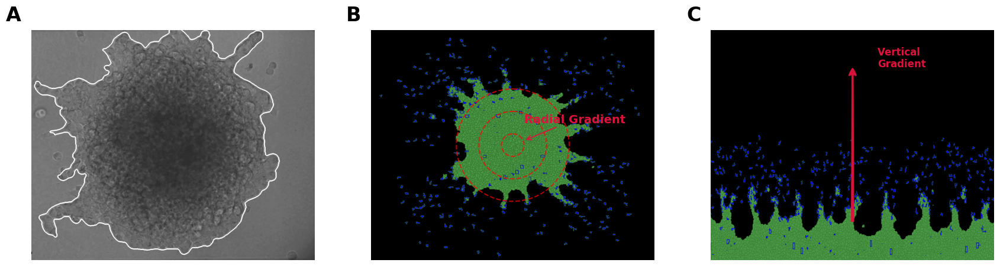

In [115]:
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib.patches as patches
import numpy as np
from pathlib import Path
import tempfile
import os

plt.style.use('default')

# ========= Choose accepted name: Fig1 or Fig5 =========
FIG_NUMBER = 5   
assert FIG_NUMBER in (1, 5), "FIG_NUMBER must be 1 or 5"
accepted_basename = f"Fig{FIG_NUMBER}"
# ======================================================

base_path = Path("../../Results/Sample")

# Load original images
img_experiment = Image.open(base_path / "experiment_tumor.png")
img_spheroid   = Image.open(base_path / "spheroid.png")
img_rectangular = Image.open(base_path / "rectangular_slab.png")

# Resize all images to match the experimental image size
target_size = img_experiment.size
img_experiment = img_experiment.resize(target_size)
img_spheroid   = img_spheroid.resize(target_size)
img_rectangular = img_rectangular.resize(target_size)

# Start plotting
fig, axs = plt.subplots(1, 3, figsize=(21, 7))
for ax in axs:
    ax.axis('off')

axs[0].imshow(img_experiment)
axs[1].imshow(img_spheroid)
axs[2].imshow(img_rectangular)

# Concentric circles and annotation on spheroid image
img_np = np.array(img_spheroid)
center_x, center_y = img_np.shape[1] // 2, img_np.shape[0] // 2
radii = [50, 150, 250]

for r in radii:
    circle = patches.Circle(
        (center_x, center_y), r, fill=False,
        linestyle='--', edgecolor='red', linewidth=1.5, alpha=0.7
    )
    axs[1].add_patch(circle)

axs[1].annotate(
    "Radial Gradient",
    xy=(center_x + 50, center_y - 20),
    xytext=(center_x + 50, center_y - 100),
    fontsize=14, color='crimson', weight='bold', ha='left',
    arrowprops=dict(arrowstyle='->', color='crimson', lw=1.5, alpha=0.9)
)

# === Lettered labels A, B, C OUTSIDE top-left of each subplot ===
labels = ['A', 'B', 'C']
pad_x = 0.008
pad_y = 0.012
for ax, lab in zip(axs, labels):
    pos = ax.get_position()
    fig.text(
        pos.x0 - pad_x, pos.y1 + pad_y, lab,
        transform=fig.transFigure,
        fontsize=24, fontweight='bold',
        ha='right', va='bottom'
    )

# Vertical arrow for gradient on the right panel (rectangular slab)
right_pos = axs[2].get_position()
x_right = (right_pos.x0 + right_pos.x1) / 2
y_bottom = right_pos.y1 - 0.09

fig.patches.append(
    patches.FancyArrowPatch(
        (x_right, right_pos.y0 + 0.09), (x_right, y_bottom),
        transform=fig.transFigure,
        arrowstyle='Fancy,head_length=8,head_width=8,tail_width=2',
        color='crimson', linewidth=2.0, alpha=0.95
    )
)
fig.text(
    x_right + 0.02, y_bottom,
    "Vertical \nGradient",
    fontsize=12, color='crimson', ha='left', weight='bold'
)

# ===== Saving helpers =====
def save_tif_lzw(fig, path_tif, dpi=300, bbox_inches='tight', pad_inches=0.3):
    """
    Save figure to .tif with LZW compression.
    Tries Matplotlib's pil_kwargs first; falls back to Pillow conversion.
    """
    # Try direct: Matplotlib -> Pillow with pil_kwargs
    try:
        fig.savefig(
            str(path_tif),
            dpi=dpi,
            bbox_inches=bbox_inches,
            pad_inches=pad_inches,
            pil_kwargs={"compression": "tiff_lzw"}
        )
        return
    except TypeError:
        # Older Matplotlib without pil_kwargs
        pass

    # Fallback: save temp PNG then convert to TIF LZW via Pillow
    with tempfile.TemporaryDirectory() as td:
        tmp_png = Path(td) / "tmp.png"
        fig.savefig(str(tmp_png), dpi=dpi, bbox_inches=bbox_inches, pad_inches=pad_inches)
        img = Image.open(tmp_png)
        if img.mode not in ("RGB", "L"):
            img = img.convert("RGB")
        img.save(str(path_tif), compression="tiff_lzw", dpi=(dpi, dpi))

# ===== Save (PNG + TIF LZW + PDF) with accepted naming =====
out_dir = Path("../../Results/Figures")
out_dir.mkdir(parents=True, exist_ok=True)

png_path = out_dir / f"{accepted_basename}.png"
tif_path = out_dir / f"{accepted_basename}.tif"   # .tif + LZW
pdf_path = out_dir / f"{accepted_basename}.pdf"

fig.savefig(str(png_path), dpi=300, bbox_inches='tight', pad_inches=0.3)
save_tif_lzw(fig, tif_path, dpi=300, bbox_inches='tight', pad_inches=0.3)
fig.savefig(str(pdf_path),        bbox_inches='tight', pad_inches=0.3)

print("Saved:")
print(" ", png_path)
print(" ", tif_path)
print(" ", pdf_path)


### Figure 2 - Phenotype Composite

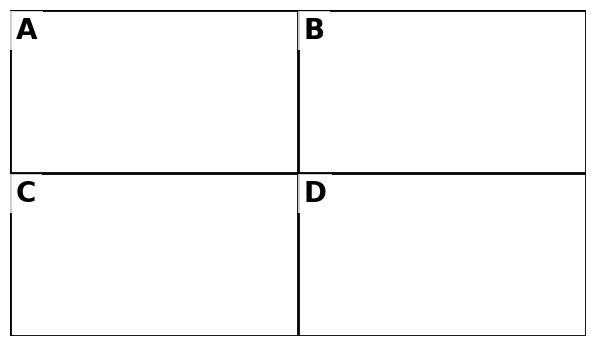

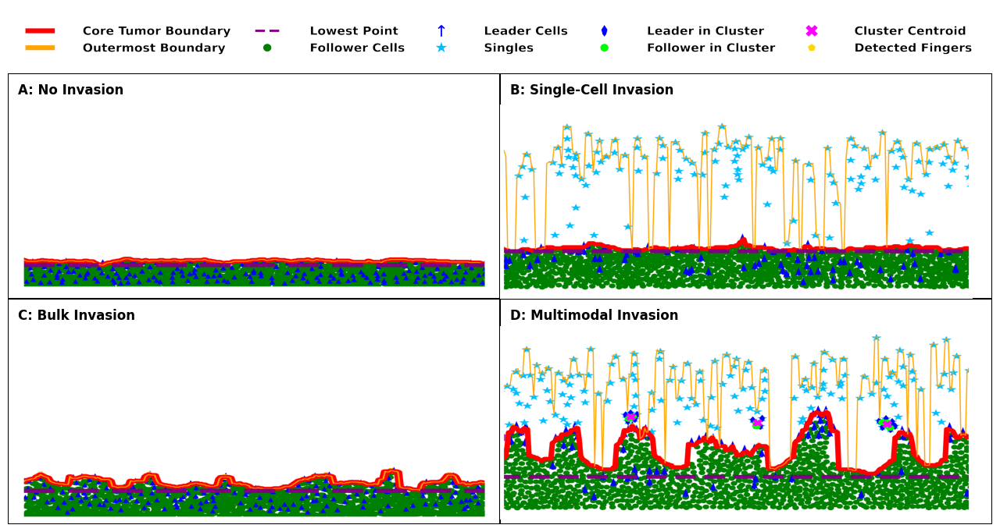

Saved:
  ../../Results/Figures/Fig6.png
  ../../Results/Figures/Fig6.tif
  ../../Results/Figures/Fig6.pdf


In [118]:
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from pathlib import Path
import tempfile

# === Choose accepted name: Fig2 or Fig6 (only change this) ===
FIG_NUMBER = 6   # set to 6 if you want "Fig6"
assert FIG_NUMBER in (2, 6), "FIG_NUMBER must be 2 or 6"
# =============================================================

# === Load images ===
base_path = "../../Results/Plots/Phenotype_Composite"

legend_img = Image.open(f"{base_path}/Legend.png")
img_A = Image.open(f"{base_path}/No_Invasion.png")
img_B = Image.open(f"{base_path}/Single_Cell_Invasion.png")
img_C = Image.open(f"{base_path}/Bulk_Invasion.png")
img_D = Image.open(f"{base_path}/Multimodal_Invasion.png")

images = [img_A, img_B, img_C, img_D]
labels = ['A', 'B', 'C', 'D']



# === Add 2x2 ruled grid ===
fig = plt.gcf()  
outer_ax = fig.add_axes([0.05, 0.05, 0.9, 0.68])
outer_ax.axis('off')

# Draw outer border
outer_ax.add_patch(Rectangle(
    (0, 0), 1, 1,
    linewidth=2, edgecolor='black', facecolor='none',
    transform=outer_ax.transAxes
))

# Vertical and horizontal dividers
outer_ax.plot([0.5, 0.5], [0, 1], color='black', linewidth=2, transform=outer_ax.transAxes)
outer_ax.plot([0, 1], [0.5, 0.5], color='black', linewidth=2, transform=outer_ax.transAxes)

# === Add letter labels ===
label_positions = [
    (0.01, 0.98),  # A
    (0.51, 0.98),  # B
    (0.01, 0.48),  # C
    (0.51, 0.48)   # D
]

for i, (x, y) in enumerate(label_positions):
    outer_ax.text(
        x, y, labels[i],
        transform=outer_ax.transAxes,
        fontsize=20, fontweight='bold',
        va='top', ha='left',
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.8)
    )

image_positions = [
    [0.01, 0.52, 0.48, 0.123],  # A: No Invasion
    [0.50, 0.5, 0.48, 0.43],    # B: Single-Cell
    [0.01, 0.01, 0.48, 0.123],  # C: Bulk
    [0.50, 0.01, 0.48, 0.43]    # D: Multimodal
]

# Define phenotype labels
phenotype_titles = [
    "No Invasion",
    "Single-Cell Invasion",
    "Bulk Invasion",
    "Multimodal Invasion"
]

# Recreate the figure with phenotype labels inside each panel (unchanged)
fig = plt.figure(figsize=(14, 8.5))
outer_ax = fig.add_axes([0.05, 0.05, 0.9, 0.68])
outer_ax.axis('off')
outer_ax.add_patch(Rectangle((0, 0), 1, 1, linewidth=1.5, edgecolor='black', facecolor='none', transform=outer_ax.transAxes))
outer_ax.plot([0.5, 0.5], [0, 1], color='black', linewidth=1.5, transform=outer_ax.transAxes)
outer_ax.plot([0, 1], [0.5, 0.5], color='black', linewidth=1.5, transform=outer_ax.transAxes)

for i, (x, y) in enumerate(label_positions):
    outer_ax.text(
        x, y, f"{labels[i]}: {phenotype_titles[i]}",
        transform=outer_ax.transAxes,
        fontsize=12, fontweight='bold',
        va='top', ha='left',
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.8)
    )

# === Add each image (unchanged) ===
for img, pos in zip(images, image_positions):
    ax = outer_ax.inset_axes(pos)
    ax.imshow(img, aspect='auto')
    ax.axis('off')

legend_ax = fig.add_axes([0.05, 0.73, 0.9, 0.1])
legend_ax.imshow(legend_img, aspect='auto')
legend_ax.axis('off')

# === Save outputs (PNG + TIF LZW + PDF) ===
out_dir = Path("../../Results/Figures")
out_dir.mkdir(parents=True, exist_ok=True)

accepted_basename = f"Fig{FIG_NUMBER}"
png_path = out_dir / f"{accepted_basename}.png"
tif_path = out_dir / f"{accepted_basename}.tif"  # .tif + LZW
pdf_path = out_dir / f"{accepted_basename}.pdf"

# PNG
plt.savefig(str(png_path), dpi=600, bbox_inches='tight', pad_inches=0.25)

# TIF with LZW (try pil_kwargs first, fallback to Pillow conversion)
try:
    plt.savefig(
        str(tif_path),
        dpi=600, bbox_inches='tight', pad_inches=0.25,
        pil_kwargs={"compression": "tiff_lzw"}
    )
except TypeError:
    # Fallback path for older Matplotlib without pil_kwargs
    with tempfile.TemporaryDirectory() as td:
        tmp_png = Path(td) / "tmp.png"
        plt.savefig(str(tmp_png), dpi=600, bbox_inches='tight', pad_inches=0.25)
        img = Image.open(str(tmp_png))
        if img.mode not in ("RGB", "L"):
            img = img.convert("RGB")
        img.save(str(tif_path), compression="tiff_lzw", dpi=(600, 600))

# PDF
plt.savefig(str(pdf_path), bbox_inches='tight', pad_inches=0.25)

plt.show()

print("Saved:")
print(" ", png_path)
print(" ", tif_path)
print(" ", pdf_path)


### Figure 3 - Tumor Snapshots

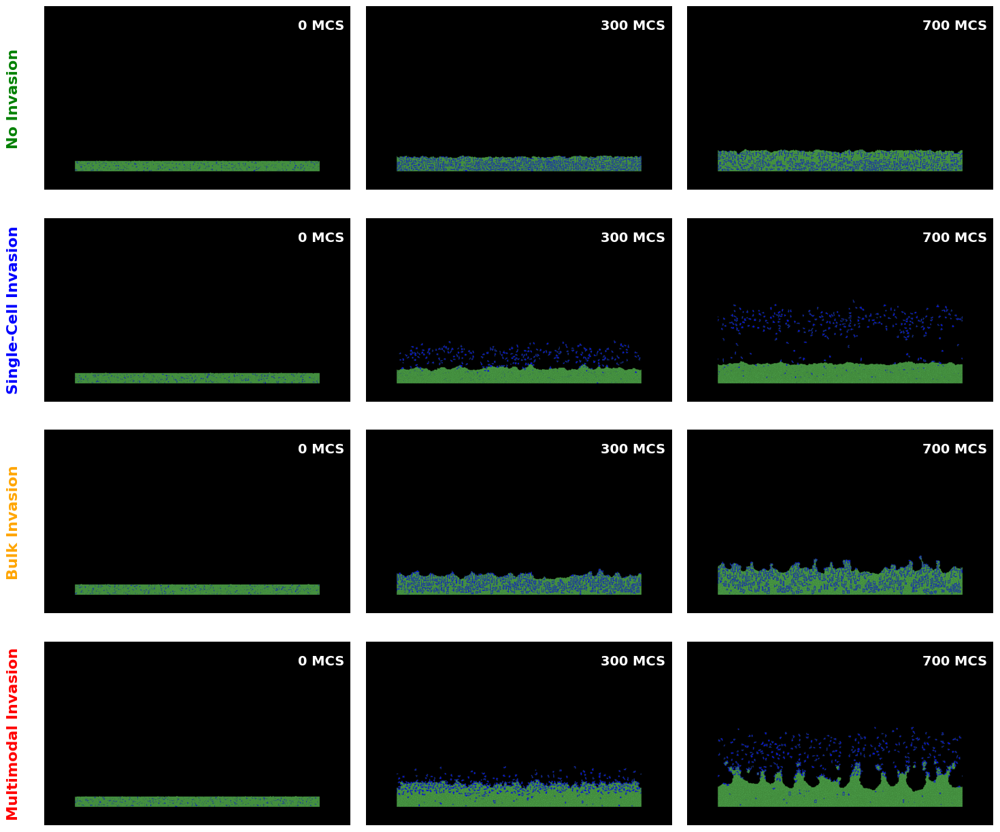

Saved:
  ../../Results/Figures/Fig1.png
  ../../Results/Figures/Fig1.tif
  ../../Results/Figures/Fig1.pdf


In [122]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from PIL import Image
from pathlib import Path
import tempfile

# === Choose accepted name: Fig1 or Fig3 ===
FIG_NUMBER = 1   # set to 1 if you want "Fig1"
assert FIG_NUMBER in (1, 3), "FIG_NUMBER must be 1 or 3"
# ==========================================

# === Define phenotypes and row labels ===
phenotypes = [
    ("No Invasion", "green"),
    ("Single-Cell Invasion", "blue"),
    ("Bulk Invasion", "orange"),
    ("Multimodal Invasion", "red")
]

row_labels = ["A", "B", "C", "D"]
time_labels = ["0 MCS", "300 MCS", "700 MCS"]

image_paths = [
    [
        "../../Results/Sample/No_Invasion/Tumor_Snapshots/Tumor_Snapshots_000.png",
        "../../Results/Sample/No_Invasion/Tumor_Snapshots/Tumor_Snapshots_300.png",
        "../../Results/Sample/No_Invasion/Tumor_Snapshots/Tumor_Snapshots_700.png"
    ],
    [
        "../../Results/Sample/Single_cell_invasion/Tumor_Snapshots/Tumor_Snapshots_000.png",
        "../../Results/Sample/Single_cell_invasion/Tumor_Snapshots/Tumor_Snapshots_300.png",
        "../../Results/Sample/Single_cell_invasion/Tumor_Snapshots/Tumor_Snapshots_700.png"
    ],
    [
        "../../Results/Sample/Bulk_Invasion/Tumor_Snapshots/Tumor_Snapshots_000.png",
        "../../Results/Sample/Bulk_Invasion/Tumor_Snapshots/Tumor_Snapshots_300.png",
        "../../Results/Sample/Bulk_Invasion/Tumor_Snapshots/Tumor_Snapshots_700.png"
    ],
    [
        "../../Results/Sample/Multimodal_invasion/Tumor_Snapshots/Tumor_Snapshots_000.png",
        "../../Results/Sample/Multimodal_invasion/Tumor_Snapshots/Tumor_Snapshots_300.png",
        "../../Results/Sample/Multimodal_invasion/Tumor_Snapshots/Tumor_Snapshots_700.png"
    ]
]

fig = plt.figure(figsize=(18, 16))
gs = gridspec.GridSpec(4, 3, wspace=0.05, hspace=0.05)  # <-- fixed

# === Plot images ===
for row, (phenotype, color) in enumerate(phenotypes):
    for col in range(3):
        ax = fig.add_subplot(gs[row, col])
        img = Image.open(image_paths[row][col])
        ax.imshow(img)
        ax.axis("off")

        # Time label (top-right)
        ax.text(
            0.98, 0.93, time_labels[col],
            transform=ax.transAxes,
            fontsize=14, weight='bold',
            ha='right', va='top',
            color='white', backgroundcolor='black'
        )

        # Phenotype name (vertical, colored) for first column
        if col == 0:
            ax.text(
                -0.10, 0.5, phenotype,
                transform=ax.transAxes,
                fontsize=16, weight='bold',
                rotation=90,
                va='center', ha='center',
                color=color
            )

# === Save outputs (PNG + TIF[LZW] + PDF) in accepted naming ===
out_dir = Path("../../Results/Figures")
out_dir.mkdir(parents=True, exist_ok=True)

accepted_basename = f"Fig{FIG_NUMBER}"
png_path = out_dir / f"{accepted_basename}.png"
tif_path = out_dir / f"{accepted_basename}.tif"   # .tif (LZW)
pdf_path = out_dir / f"{accepted_basename}.pdf"

# PNG
plt.savefig(str(png_path), dpi=600, bbox_inches='tight', pad_inches=0.25)

# TIF with LZW: try pil_kwargs, else fallback via Pillow
try:
    plt.savefig(
        str(tif_path),
        dpi=600, bbox_inches='tight', pad_inches=0.25,
        pil_kwargs={"compression": "tiff_lzw"}
    )
except TypeError:
    # Older Matplotlib: save a temp PNG, then convert to TIF LZW
    with tempfile.TemporaryDirectory() as td:
        tmp_png = Path(td) / "tmp.png"
        plt.savefig(str(tmp_png), dpi=600, bbox_inches='tight', pad_inches=0.25)
        img = Image.open(tmp_png)
        if img.mode not in ("RGB", "L"):
            img = img.convert("RGB")
        img.save(str(tif_path), compression="tiff_lzw", dpi=(600, 600))

# PDF
plt.savefig(str(pdf_path), bbox_inches='tight', pad_inches=0.25)

plt.show()

print("Saved:")
print(" ", png_path)
print(" ", tif_path)
print(" ", pdf_path)


### Figure 4 - 3D Phenotype PhaseSpace

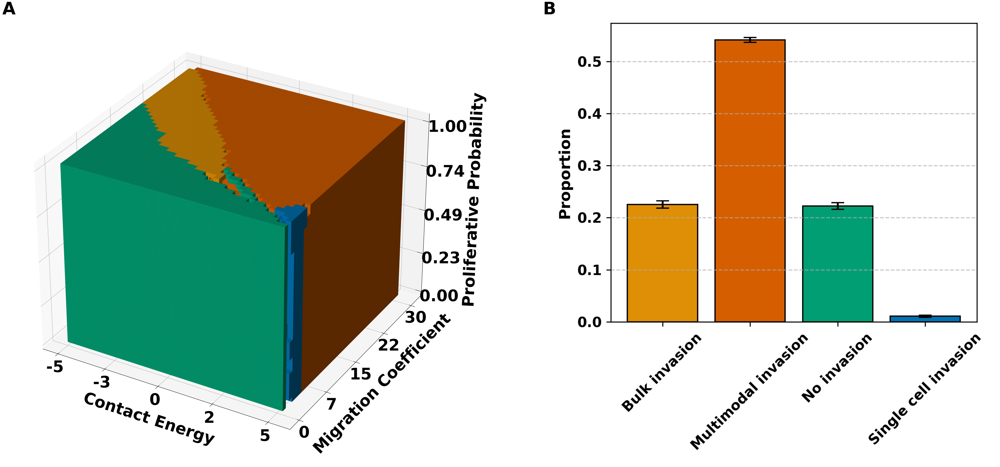

Saved:
  ../../Results/Figures/Fig2.png
  ../../Results/Figures/Fig2.tif
  ../../Results/Figures/Fig2.pdf


In [126]:
from PIL import Image
import matplotlib.pyplot as plt
from pathlib import Path
import tempfile

# ===== Accepted name switch: Fig2 or Fig4 =====
FIG_NUMBER = 2   # set to 2 if you want "Fig2"
assert FIG_NUMBER in (2, 4), "FIG_NUMBER must be 2 or 4"
# ==============================================

base_path = Path("../../Results/Plots/Phenotypes")

# Load images
img_A = Image.open(base_path / "phenotype_phase_space.png")
img_B = Image.open(base_path / "phenotype_distribution.png")

# Match heights, stack side-by-side
phenotype_height = img_A.height
barchart_new_width = int(img_B.width * (phenotype_height / img_B.height))
img_B_scaled = img_B.resize((barchart_new_width, phenotype_height))

total_width = img_A.width + img_B_scaled.width
combined_img = Image.new("RGB", (total_width, phenotype_height), color=(255, 255, 255))
combined_img.paste(img_A, (0, 0))
combined_img.paste(img_B_scaled, (img_A.width, 0))

# Render for labels (unchanged figure structure)
plt.figure(figsize=(total_width / 100, phenotype_height / 100))
plt.imshow(combined_img)
plt.axis('off')

plt.text(10, 50, "A", fontsize=100, fontweight='bold', color='black', backgroundcolor='white')
plt.text(img_A.width + 10, 50, "B", fontsize=100, fontweight='bold', color='black', backgroundcolor='white')

# === Export ===
DPI = 300
out_dir = Path("../../Results/Figures")
out_dir.mkdir(parents=True, exist_ok=True)

accepted_basename = f"Fig{FIG_NUMBER}"
png_path = out_dir / f"{accepted_basename}.png"
tif_path = out_dir / f"{accepted_basename}.tif"   # .tif + LZW
pdf_path = out_dir / f"{accepted_basename}.pdf"

# PNG
plt.savefig(str(png_path), dpi=DPI, bbox_inches='tight', pad_inches=0)

# TIF with LZW: try pil_kwargs first; fallback via Pillow if needed
try:
    plt.savefig(
        str(tif_path),
        dpi=DPI, bbox_inches='tight', pad_inches=0,
        pil_kwargs={"compression": "tiff_lzw"}
    )
except TypeError:
    # Older Matplotlib: save temp PNG then convert to TIF (LZW) via Pillow
    with tempfile.TemporaryDirectory() as td:
        tmp_png = Path(td) / "tmp.png"
        plt.savefig(str(tmp_png), dpi=DPI, bbox_inches='tight', pad_inches=0)
        tmp_img = Image.open(tmp_png)
        if tmp_img.mode not in ("RGB", "L"):
            tmp_img = tmp_img.convert("RGB")
        tmp_img.save(str(tif_path), compression="tiff_lzw", dpi=(DPI, DPI))

# PDF
plt.savefig(str(pdf_path), bbox_inches='tight', pad_inches=0)

plt.show()

print("Saved:")
print(" ", png_path)
print(" ", tif_path)
print(" ", pdf_path)


In [168]:
from PIL import Image
import matplotlib.pyplot as plt
from pathlib import Path
import os

# ===== Accepted name switch: Fig2 or Fig4 =====
FIG_NUMBER = 2   
assert FIG_NUMBER in (2, 4), "FIG_NUMBER must be 2 or 4"
# ==============================================

base_path = Path("../../Results/Plots/Phenotypes")

# ---------------- Load images ----------------
img_A = Image.open(base_path / "phenotype_phase_space.png")
img_B = Image.open(base_path / "phenotype_distribution.png")

# Match heights, stack side-by-side
phenotype_height = img_A.height
barchart_new_width = int(img_B.width * (phenotype_height / img_B.height))
img_B_scaled = img_B.resize((barchart_new_width, phenotype_height), Image.LANCZOS)

total_width = img_A.width + img_B_scaled.width
combined_img = Image.new("RGB", (total_width, phenotype_height), color=(255, 255, 255))
combined_img.paste(img_A, (0, 0))
combined_img.paste(img_B_scaled, (img_A.width, 0))

# ---------------- Render for labels ----------------
DPI = 300
PPI = DPI   # 1:1 mapping: saved pixels ~= combined_img size

fig_w = total_width / PPI
fig_h = phenotype_height / PPI

plt.figure(figsize=(fig_w, fig_h))
plt.imshow(combined_img)
plt.axis('off')


LABEL_FS = 40
plt.text(10, 50, "A", fontsize=LABEL_FS, fontweight='bold',
         color='black', backgroundcolor='white')
plt.text(img_A.width + 10, 50, "B", fontsize=LABEL_FS, fontweight='bold',
         color='black', backgroundcolor='white')

# ---------------- Export: PNG + PDF ----------------
out_dir = Path("../../Results/Figures")
out_dir.mkdir(parents=True, exist_ok=True)

accepted_basename = f"Fig{FIG_NUMBER}"
png_path = out_dir / f"{accepted_basename}.png"
tif_path = out_dir / f"{accepted_basename}.tif"
pdf_path = out_dir / f"{accepted_basename}.pdf"

# PNG 
plt.savefig(
    str(png_path),
    dpi=DPI,
    bbox_inches='tight',
    pad_inches=0,
    facecolor="white",
)

# PDF
plt.savefig(
    str(pdf_path),
    dpi=DPI,
    bbox_inches='tight',
    pad_inches=0,
    facecolor="white",
)

plt.close()


img = Image.open(str(png_path))

if img.mode not in ("RGB", "L"):
    img = img.convert("RGB")

img_q = img.quantize(colors=256, method=Image.MEDIANCUT)
img_q = img_q.convert("RGB")  

img_q.save(str(tif_path), compression="tiff_lzw", dpi=(DPI, DPI))

# ---------------- Report sizes ----------------
png_size_mb = png_path.stat().st_size / (1024 * 1024)
tif_size_mb = tif_path.stat().st_size / (1024 * 1024)

print("Saved:")
print("  ", png_path, f"({png_size_mb:.2f} MB)")
print("  ", tif_path, f"({tif_size_mb:.2f} MB)")
print("  ", pdf_path)


Saved:
   ../../Results/Figures/Fig2.png (2.64 MB)
   ../../Results/Figures/Fig2.tif (4.37 MB)
   ../../Results/Figures/Fig2.pdf


### Figure 5 - Cluster Phase Bar of TotalCells and PersistenceTime

In [151]:
from __future__ import annotations

import os
from typing import List, Tuple, Optional

import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# ==============================
# Global Matplotlib config
# ==============================
mpl.rcParams["pdf.fonttype"] = 42
mpl.rcParams["ps.fonttype"]  = 42
mpl.rcParams["font.size"] = 12  


# ==============================
# Helper: load and prepare data
# ==============================
def load_cluster_data(
    csv_path: str,
    pp_fixed: Optional[float] = None,
    y_col: str = "Total Cells",
    color_col: str = "PersistenceTime",
) -> pd.DataFrame:
    df = pd.read_csv(csv_path)

    needed = {"Jlf", "mu", "PP", y_col, color_col}
    missing = needed - set(df.columns)
    if missing:
        raise ValueError(f"CSV missing columns: {sorted(missing)}")

    # Coerce numerics
    for c in ["Jlf", "mu", "PP", y_col, color_col]:
        df[c] = pd.to_numeric(df[c], errors="coerce")
    df = df.dropna(subset=["Jlf", "mu", "PP", y_col, color_col])

    if pp_fixed is not None:
        mask = np.isclose(df["PP"], pp_fixed)
        if not mask.any():
            raise ValueError(f"No rows with PP={pp_fixed} found.")
        df = df[mask].copy()

    return df


def renumber_clusters(df: pd.DataFrame, y_col: str = "Total Cells") -> pd.DataFrame:
    """
    Sequential cluster id per (mu, Jlf, PP) for bar positions,
    using groupby.cumcount (no FutureWarning).
    """
    df_sorted = df.sort_values(
        ["mu", "Jlf", "PP", y_col],
        ascending=[True, True, True, True],
        kind="stable",
    ).copy()

    df_sorted["ClusterID_renum"] = (
        df_sorted
        .groupby(["mu", "Jlf", "PP"])
        .cumcount()
        + 1
    )

    return df_sorted


# ==============================
# Strategy: pick a λ–Jlf grid for 12 panels
# ==============================
def select_grid_values(
    df: pd.DataFrame,
    jlf_min: float = -5.0,
    jlf_max: float = 5.0,
    jlf_step: float = 1.0,
    n_mu: int = 4,
    n_jlf: int = 3,
) -> Tuple[List[float], List[float]]:
    """
    Pick n_mu migration values and n_jlf contact-energy values,
    spaced across the full range, to form an n_jlf × n_mu grid.
    """
    # Use actual μ values present in the data
    mu_all = np.sort(df["mu"].unique())
    if len(mu_all) < n_mu:
        n_mu = len(mu_all)
    mu_idx = np.linspace(0, len(mu_all) - 1, num=n_mu, dtype=int)
    mu_sel = [float(mu_all[i]) for i in np.unique(mu_idx)]

    # Regular Jlf grid from configured min/max/step
    jlf_all = np.arange(jlf_min, jlf_max + 1e-9, jlf_step)
    if len(jlf_all) < n_jlf:
        n_jlf = len(jlf_all)
    jlf_idx = np.linspace(0, len(jlf_all) - 1, num=n_jlf, dtype=int)
    jlf_sel = [float(jlf_all[i]) for i in np.unique(jlf_idx)]

    mu_sel = mu_sel[:n_mu]
    jlf_sel = jlf_sel[:n_jlf]

    return mu_sel, jlf_sel


# ==============================
# Main representative plotting
# ==============================
def plot_representative_phase_bars(
    csv_path: str,
    save_base: str,
    representative_combos: Optional[List[Tuple[float, float]]] = None,
    pp_fixed: Optional[float] = 0.9,
    y_col: str = "Total Cells",
    color_col: str = "PersistenceTime",
    n_mu: int = 4,                  # 4 λ values (columns)
    n_jlf: int = 3,                 # 3 Jlf values (rows) → 12 panels
    figsize: Tuple[float, float] = (20, 12),
    jlf_min: float = -5.0,
    jlf_max: float = 5.0,
    jlf_step: float = 1.0,
) -> List[str]:
    """
    Plot 12 representative (mu, Jlf) panels in a λ–Jlf grid,
    with a big outer axis indicating Migration coefficient (x)
    and Contact energy (y) with arrows, placed outside the panel block.
    """

    # -----------------------
    # Load and prep data
    # -----------------------
    df = load_cluster_data(csv_path, pp_fixed=pp_fixed, y_col=y_col, color_col=color_col)
    df = renumber_clusters(df, y_col=y_col)

    # Decide which (mu, Jlf) combos to show
    if representative_combos is None:
        mu_sel, jlf_sel = select_grid_values(
            df,
            jlf_min=jlf_min,
            jlf_max=jlf_max,
            jlf_step=jlf_step,
            n_mu=n_mu,
            n_jlf=n_jlf,
        )
        # Cartesian product: rows = Jlf, columns = μ
        representative_combos = [(mu, jlf) for jlf in jlf_sel for mu in mu_sel]
    else:
        mu_sel = sorted({mu for (mu, _jlf) in representative_combos})
        jlf_sel = sorted({jlf for (_mu, jlf) in representative_combos})

    combos_set = {(float(mu), float(jlf)) for (mu, jlf) in representative_combos}

    # Gather sub-data for each grid point
    grid_entries: List[Tuple[Tuple[float, float], pd.DataFrame]] = []
    for jlf in jlf_sel:
        for mu in mu_sel:
            if (mu, jlf) in combos_set:
                mask = np.isclose(df["mu"], mu) & np.isclose(df["Jlf"], jlf)
                sub = df[mask].copy()
            else:
                sub = pd.DataFrame(columns=df.columns)
            grid_entries.append(((mu, jlf), sub))

    # -----------------------
    # Global scales (from non-empty panels)
    # -----------------------
    nonempty_subs = [sub for (_key, sub) in grid_entries if not sub.empty]
    if nonempty_subs:
        all_y = np.concatenate([sub[y_col].to_numpy() for sub in nonempty_subs])
        ymin, ymax = np.nanmin(all_y), np.nanmax(all_y)
        if ymax == ymin:
            ymin -= 0.5
            ymax += 0.5
        else:
            pad = 0.05 * (ymax - ymin)
            ymin -= pad
            ymax += pad

        max_bars = max(sub["ClusterID_renum"].max() for sub in nonempty_subs)
    else:
        ymin, ymax, max_bars = 0.0, 1.0, 1

    # Color scaling shared across non-empty panels
    if nonempty_subs:
        all_c = np.concatenate([sub[color_col].to_numpy() for sub in nonempty_subs])
        cmin, cmax = float(np.nanmin(all_c)), float(np.nanmax(all_c))
    else:
        cmin, cmax = 0.0, 1.0

    cmap = mpl.colormaps.get_cmap("plasma")
    norm = plt.Normalize(vmin=cmin, vmax=cmax)

    # -----------------------
    # Figure layout: rows = Jlf, columns = μ
    # -----------------------
    nrows = len(jlf_sel)
    ncols = len(mu_sel)

    # Use constrained_layout to keep panels spacious
    fig, axes = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=figsize,
        squeeze=False,
        sharey=True,
        constrained_layout=True,
    )

    # Fonts (bigger + bold)
    title_fs = 18
    label_fs = 18
    tick_fs = 14
    cbar_label_fs = 20
    cbar_tick_fs = 16
    outer_label_fs = 24  # big axis labels

    entry_lookup = {(mu, jlf): sub for (mu, jlf), sub in grid_entries}

    for row, jlf in enumerate(jlf_sel):
        for col, mu in enumerate(mu_sel):
            ax = axes[row, col]
            sub = entry_lookup.get((mu, jlf), pd.DataFrame(columns=df.columns))

            if sub.empty:
                ax.text(
                    0.5, 0.5, "No clusters",
                    transform=ax.transAxes,
                    ha="center", va="center",
                    fontsize=label_fs, fontweight="bold", color="gray",
                )
                ax.set_xlim(0.5, max_bars + 0.5)
                ax.set_ylim(ymin, ymax)
            else:
                colors = cmap(norm(sub[color_col].to_numpy()))
                ax.bar(sub["ClusterID_renum"], sub[y_col], color=colors, alpha=0.95)
                ax.set_ylim(ymin, ymax)
                ax.set_xlim(0.5, max_bars + 0.5)

                if max_bars == 1:
                    ax.set_xticks([1])
                else:
                    ticks = np.linspace(1, max_bars, num=min(max_bars, 4), dtype=int)
                    ax.set_xticks(np.unique(ticks))

            # Panel title
            ax.set_title(
                f"λ={mu:g}, Jlf={jlf:g}",
                fontsize=title_fs,
                fontweight="bold",
            )

            # Axis labels on every panel
            ax.set_xlabel("Clusters", fontsize=label_fs, fontweight="bold")
            ax.set_ylabel(y_col, fontsize=label_fs, fontweight="bold")

            # Tick labels: bigger + bold
            ax.tick_params(axis="both", labelsize=tick_fs)
            for t in ax.get_xticklabels() + ax.get_yticklabels():
                t.set_fontweight("bold")

            # Thicker spines
            for spine in ax.spines.values():
                spine.set_linewidth(1.5)

    # -----------------------
    # Shared colorbar on the right
    # -----------------------
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    axes_flat = [ax for row in axes for ax in row]
    cbar = fig.colorbar(
        sm,
        ax=axes_flat,
        orientation="vertical",
        fraction=0.05,
        pad=0.02,
    )
    cbar.set_label(color_col.replace("_", " "),
                   fontsize=cbar_label_fs,
                   fontweight="bold")
    cbar.ax.tick_params(labelsize=cbar_tick_fs)
    for t in cbar.ax.get_yticklabels():
        t.set_fontweight("bold")

    # =======================
    # Big outer axes (arrows)
    # =======================
    fig.canvas.draw()
    x0 = min(ax.get_position().x0 for ax in axes_flat)
    y0 = min(ax.get_position().y0 for ax in axes_flat)
    x1 = max(ax.get_position().x1 for ax in axes_flat)
    y1 = max(ax.get_position().y1 for ax in axes_flat)
    
    x_arrow_h = 2.5 * y0           # half of the space below panels
    y_arrow_w = 2.5 * x0           # half of the space to the left

    # ---- X-axis arrow axis (below panels) ----
    x_arrow_ax = fig.add_axes(
        [x0, y0 - x_arrow_h, x1 - x0, x_arrow_h],
        frameon=False,
    )
    x_arrow_ax.set_xlim(0, 1)
    x_arrow_ax.set_ylim(0, 1)
    x_arrow_ax.set_xticks([])
    x_arrow_ax.set_yticks([])
    x_arrow_ax.axis("off")

    # Draw right-pointing arrow
    x_arrow_ax.annotate(
        "",
        xy=(0.90, 0.5),
        xytext=(0.10, 0.5),
        arrowprops=dict(arrowstyle="->", linewidth=2),
    )
    x_arrow_ax.text(
        0.50, 0.10,
        "Migration coefficient",
        ha="center",
        va="bottom",
        fontsize=outer_label_fs,
        fontweight="bold",
    )

    # ---- Y-axis arrow axis (left of panels) ----
    y_arrow_ax = fig.add_axes(
        [x0 - y_arrow_w, y0, y_arrow_w, y1 - y0],
        frameon=False,
    )
    y_arrow_ax.set_xlim(0, 1)
    y_arrow_ax.set_ylim(0, 1)
    y_arrow_ax.set_xticks([])
    y_arrow_ax.set_yticks([])
    y_arrow_ax.axis("off")

    # Draw up-pointing arrow
    y_arrow_ax.annotate(
        "",
        xy=(0.5, 0.10),
        xytext=(0.5, 0.90),
        arrowprops=dict(arrowstyle="->", linewidth=2),
    )
    y_arrow_ax.text(
        0.10, 0.50,
        "Contact energy",
        ha="center",
        va="center",
        rotation=90,
        fontsize=outer_label_fs,
        fontweight="bold",
    )

    # -----------------------
    # Save outputs
    # -----------------------
    os.makedirs(os.path.dirname(save_base) or ".", exist_ok=True)
    png_path = f"{save_base}.png"
    tif_path = f"{save_base}.tif"   # PLOS prefers .tif, not .tiff
    pdf_path = f"{save_base}.pdf"

    # PNG
    fig.savefig(png_path, dpi=300, bbox_inches="tight")

    # TIF with LZW compression
    try:
        # Newer Matplotlib supports pil_kwargs
        fig.savefig(
            tif_path,
            dpi=300,
            bbox_inches="tight",
            pil_kwargs={"compression": "tiff_lzw"},
        )
    except TypeError:
        # Fallback: save temp PNG then convert to TIF LZW with Pillow
        with tempfile.TemporaryDirectory() as td:
            tmp_png = os.path.join(td, "tmp.png")
            fig.savefig(tmp_png, dpi=300, bbox_inches="tight")
            im = Image.open(tmp_png)
            if im.mode not in ("RGB", "L"):
                im = im.convert("RGB")
            im.save(tif_path, compression="tiff_lzw", dpi=(300, 300))

    # PDF
    fig.savefig(pdf_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

    return [png_path, tif_path, pdf_path]



# ==============================
# Example usage 
# ==============================
if __name__ == "__main__":
    representative_combos = None

    outputs = plot_representative_phase_bars(
        csv_path="../../Results/Data/Clusters/cluster_detailed.csv",
        save_base="../../Results/Figures/Fig3",
        representative_combos=representative_combos,
        pp_fixed=0.9,     # same PP slice as your big phase plot
        n_mu=4,           # 4 λ values (columns)
        n_jlf=2,          # 3 Jlf values (rows) → 12 panels
        figsize=(20, 8),
        jlf_min=0.0,
        jlf_max=5.0,
        jlf_step=1.0,
    )

    print("Saved files:")
    for p in outputs:
        print("  -", p)


Saved files:
  - ../../Results/Figures/Fig3.png
  - ../../Results/Figures/Fig3.tif
  - ../../Results/Figures/Fig3.pdf


### Figure 6 - Proliferative Probability shows limited effects

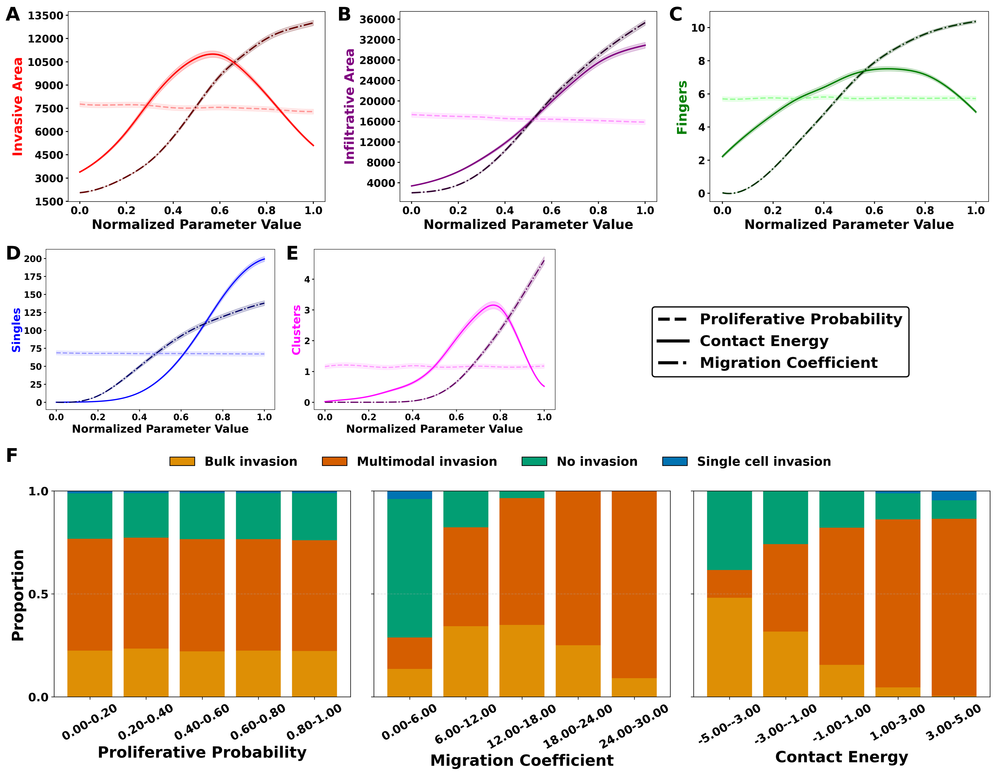

Saved:
- ../../Results/Figures/Fig4.png
- ../../Results/Figures/Fig4.tif
- ../../Results/Figures/Fig4.pdf


In [143]:
import os
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
import tempfile

# ========== Accepted name switch ==========
FIG_NUMBER = 4          # set to 4 if you want "Fig4"
assert FIG_NUMBER in (4, 6), "FIG_NUMBER must be 4 or 6"
accepted_basename = f"Fig{FIG_NUMBER}"
# =========================================

# ------------------ Panel list ------------------
# (path, panel_letter, caption)
PANELS = [
    ("../../Results/Plots/Invasion_Metrics_Plots/Invasion_Metrics_Trends/invasive_area.png",       "A", "Invasive Area"),
    ("../../Results/Plots/Invasion_Metrics_Plots/Invasion_Metrics_Trends/infiltrative_area.png",   "B", "Infiltrative Area"),
    ("../../Results/Plots/Invasion_Metrics_Plots/Invasion_Metrics_Trends/fingers.png",             "C", "Fingers"),
    ("../../Results/Plots/Invasion_Metrics_Plots/Invasion_Metrics_Trends/singles.png",             "D", "Singles"),
    ("../../Results/Plots/Invasion_Metrics_Plots/Invasion_Metrics_Trends/clusters.png",            "E", "Clusters"),
    ("../../Results/Plots/Phenotypes/phenotype_distribution_Parameter.png",                               "F", "Phenotype proportions"),
]

# Legend image (Row 2, Column 3)
LEGEND_PATH = "../../Results/Plots/Invasion_Metrics_Plots/Invasion_Metrics_Trends/legend_parameters.png"
PANELS.append((LEGEND_PATH, "", "Legend"))   # empty letter => no overlay label

# Indices into PANELS (0-based)
ROWS = [
    [0, 1, 2],   # Row 1: A B C  (reference width)
    [3, 4, 6],   # Row 2: D E Legend
    [5],         # Row 3: F alone
]

# ------------------ Scaling controls ------------------
AE_SCALE = 1.5          # A–E scale (or (sx, sy))
F_SCALE  = 2.0          # F scale (or (sx, sy))
PER_LETTER_MULTIPLIER = {}  # e.g., {"C": 1.1}

# ------------------ Layout tuning ------------------
HGUTTER_DEFAULT = 40
VGUTTER = 50
LEFT_PAD = RIGHT_PAD = 30
TOP_PAD = 30
BOTTOM_PAD = 50
LETTER_PAD_X = 10
LETTER_PAD_Y = 18
PPI = 100                 # display PPI for matplotlib figure size
COMMON_FS = 100           # fixed fontsize for A–F letters

# ------------------ Load panels ------------------
loaded = []
for path, letter, cap in PANELS:
    if not os.path.exists(path):
        raise FileNotFoundError(f"Missing panel: {path}")
    img = Image.open(path).convert("RGB")  # 8-bit RGB, flattened
    loaded.append((img, letter, cap))

# ------------------ Scaling helpers ------------------
def merge_scale(base_scale, extra_scale):
    if isinstance(base_scale, (tuple, list)) and len(base_scale) == 2:
        sx, sy = float(base_scale[0]), float(base_scale[1])
    else:
        s = float(base_scale)
        sx, sy = s, s
    if extra_scale is None:
        return (sx, sy)
    m = float(extra_scale)
    return (sx * m, sy * m)

def scale_for_letter(letter: str):
    if letter in "ABCDE":
        base = AE_SCALE
    elif letter == "F":
        base = F_SCALE
    else:
        base = 1.0
    extra = PER_LETTER_MULTIPLIER.get(letter)
    return merge_scale(base, extra)

def resize_with_scale(img: Image.Image, scale):
    sx, sy = scale_for_letter(scale) if isinstance(scale, str) else (
        scale if isinstance(scale, (tuple, list)) else (float(scale), float(scale))
    )
    w, h = img.size
    new_w = max(1, int(round(w * sx)))
    new_h = max(1, int(round(h * sy)))
    return img.resize((new_w, new_h), Image.LANCZOS)

def uniform_row_rescale(row_scaled, factor):
    out = []
    for im, letter, cap in row_scaled:
        new_w = max(1, int(round(im.width * factor)))
        new_h = max(1, int(round(im.height * factor)))
        out.append((im.resize((new_w, new_h), Image.LANCZOS), letter, cap))
    return out

# ------------------ Initial per-row resize (unify height within each row) ------------------
resized_rows = []
for row in ROWS:
    row_scaled = []
    for idx in row:
        img, letter, cap = loaded[idx]
        s = scale_for_letter(letter)
        row_scaled.append((resize_with_scale(img, s), letter, cap))

    target_h = max(im.height for im, _, _ in row_scaled)
    row_resized = []
    for im, letter, cap in row_scaled:
        if im.height != target_h:
            scale = target_h / im.height
            im = im.resize((int(round(im.width * scale)), target_h), Image.LANCZOS)
        row_resized.append((im, letter, cap))
    resized_rows.append(row_resized)

# ------------------ Match row widths to Row 1 ------------------
def row_content_width(row, gutter):
    return sum(im.width for im, _, _ in row) + gutter * (len(row) - 1 if len(row) > 1 else 0)

target_content_width = row_content_width(resized_rows[0], HGUTTER_DEFAULT)

row_specific_gutters = []
adjusted_rows = []
for r_idx, row in enumerate(resized_rows):
    n = len(row)
    base_w = sum(im.width for im, _, _ in row)

    if n == 1:
        # Scale single panel (Row 3) to match Row 1 width
        factor = target_content_width / max(1, base_w)
        adjusted = uniform_row_rescale(row, factor)
        row_specific_gutters.append(0)
        adjusted_rows.append(adjusted)
    else:
        needed_gutter = (target_content_width - base_w) / (n - 1)
        if needed_gutter >= 0:
            # Keep image sizes; adjust gutter to hit the exact width
            row_specific_gutters.append(needed_gutter)
            adjusted_rows.append(row)
        else:
            # Too wide: scale images down uniformly, keep default gutter
            factor = (target_content_width - HGUTTER_DEFAULT * (n - 1)) / base_w
            adjusted = uniform_row_rescale(row, factor)
            row_specific_gutters.append(HGUTTER_DEFAULT)
            adjusted_rows.append(adjusted)

resized_rows = adjusted_rows

# ------------------ Compute canvas size ------------------
row_widths = [row_content_width(row, row_specific_gutters[i]) for i, row in enumerate(resized_rows)]
row_heights = [row[0][0].height for row in resized_rows]
total_width = max(row_widths) + LEFT_PAD + RIGHT_PAD
total_height = sum(row_heights) + VGUTTER * (len(resized_rows) - 1) + TOP_PAD + BOTTOM_PAD

canvas = Image.new("RGB", (total_width, total_height), color=(255, 255, 255))

# ------------------ Paste panels ------------------
xpos_meta = []  # (x, y, w, h, letter, caption)
y = TOP_PAD
for r, row in enumerate(resized_rows):
    gutter = row_specific_gutters[r]
    row_w = row_widths[r]
    x = LEFT_PAD + (total_width - LEFT_PAD - RIGHT_PAD - row_w) // 2
    for i, (im, letter, cap) in enumerate(row):
        canvas.paste(im, (int(round(x)), int(round(y))))
        xpos_meta.append((int(round(x)), int(round(y)), im.width, im.height, letter, cap))
        x += im.width + (gutter if i < len(row) - 1 else 0)
    y += row_heights[r] + VGUTTER

# ------------------ Draw labels ------------------
fig_w, fig_h = total_width / PPI, total_height / PPI
plt.figure(figsize=(fig_w, fig_h))
plt.imshow(canvas)
plt.axis("off")

for (x, y, w, h, letter, cap) in xpos_meta:
    if not letter:  # skip legend
        continue
    t = plt.text(
        x + LETTER_PAD_X, y + LETTER_PAD_Y, letter,
        fontsize=COMMON_FS, fontweight="bold", color="black",
        ha="left", va="top"
    )
    t.set_path_effects([pe.withStroke(linewidth=3, foreground="white", alpha=0.9)])

# ------------------ Save (PNG, TIF[LZW], PDF) ------------------
DPI = 300
out_dir = Path("../../Results/Figures")
out_dir.mkdir(parents=True, exist_ok=True)

png_path = out_dir / f"{accepted_basename}.png"
tif_path = out_dir / f"{accepted_basename}.tif"   # .tif (LZW)
pdf_path = out_dir / f"{accepted_basename}.pdf"

# PNG / PDF
plt.savefig(str(png_path), dpi=DPI, bbox_inches='tight', pad_inches=0, facecolor="white")
plt.savefig(str(pdf_path),        bbox_inches='tight', pad_inches=0, facecolor="white")

# TIF with LZW: try pil_kwargs; fallback via Pillow if needed
try:
    plt.savefig(
        str(tif_path),
        dpi=DPI,
        bbox_inches='tight',
        pad_inches=0,
        facecolor="white",
        format="tiff",
        pil_kwargs={"compression": "tiff_lzw"}
    )
except TypeError:
    # Older Matplotlib: save temp PNG, then convert to TIF LZW via Pillow
    with tempfile.TemporaryDirectory() as td:
        tmp_png = Path(td) / "tmp.png"
        plt.savefig(str(tmp_png), dpi=DPI, bbox_inches='tight', pad_inches=0, facecolor="white")
        tmp_img = Image.open(str(tmp_png))
        if tmp_img.mode not in ("RGB", "L"):
            tmp_img = tmp_img.convert("RGB")
        tmp_img.save(str(tif_path), compression="tiff_lzw", dpi=(DPI, DPI))

plt.show()
print(f"Saved:\n- {png_path}\n- {tif_path}\n- {pdf_path}")


#### Reduced size

In [167]:
import os
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
import tempfile

# ========== Accepted name switch ==========
FIG_NUMBER = 4          # set to 4 if you want "Fig4"
assert FIG_NUMBER in (4, 6), "FIG_NUMBER must be 4 or 6"
accepted_basename = f"Fig{FIG_NUMBER}"
# =========================================

# ------------------ Panel list ------------------
# (path, panel_letter, caption)
PANELS = [
    ("../../Results/Plots/Invasion_Metrics_Plots/Invasion_Metrics_Trends/invasive_area.png",       "A", "Invasive Area"),
    ("../../Results/Plots/Invasion_Metrics_Plots/Invasion_Metrics_Trends/infiltrative_area.png",   "B", "Infiltrative Area"),
    ("../../Results/Plots/Invasion_Metrics_Plots/Invasion_Metrics_Trends/fingers.png",             "C", "Fingers"),
    ("../../Results/Plots/Invasion_Metrics_Plots/Invasion_Metrics_Trends/singles.png",             "D", "Singles"),
    ("../../Results/Plots/Invasion_Metrics_Plots/Invasion_Metrics_Trends/clusters.png",            "E", "Clusters"),
    ("../../Results/Plots/Phenotypes/phenotype_distribution_Parameter.png",                        "F", "Phenotype proportions"),
]

# Legend image (Row 2, Column 3)
LEGEND_PATH = "../../Results/Plots/Invasion_Metrics_Plots/Invasion_Metrics_Trends/legend_parameters.png"
PANELS.append((LEGEND_PATH, "", "Legend"))   # empty letter => no overlay label

# Indices into PANELS (0-based)
ROWS = [
    [0, 1, 2],   # Row 1: A B C  (reference width)
    [3, 4, 6],   # Row 2: D E Legend
    [5],         # Row 3: F alone
]

# ------------------ Scaling controls ------------------
AE_SCALE = 1.5          # A–E scale (or (sx, sy))
F_SCALE  = 2.0          # F scale (or (sx, sy))
PER_LETTER_MULTIPLIER = {}  # e.g., {"C": 1.1}

# ------------------ Layout tuning ------------------
HGUTTER_DEFAULT = 40
VGUTTER = 50
LEFT_PAD = RIGHT_PAD = 30
TOP_PAD = 30
BOTTOM_PAD = 50
LETTER_PAD_X = -10
LETTER_PAD_Y = -10
COMMON_FS = 12           # fixed fontsize for A–F letters

# Resolution (PLOS: 300 dpi is fine, 600 only if needed)
DPI = 300
PPI = DPI                 # 1:1 mapping between canvas pixels and saved pixels

# ------------------ Load panels ------------------
loaded = []
for path, letter, cap in PANELS:
    if not os.path.exists(path):
        raise FileNotFoundError(f"Missing panel: {path}")
    img = Image.open(path).convert("RGB")  # 8-bit RGB, flattened
    loaded.append((img, letter, cap))

# ------------------ Scaling helpers ------------------
def merge_scale(base_scale, extra_scale):
    if isinstance(base_scale, (tuple, list)) and len(base_scale) == 2:
        sx, sy = float(base_scale[0]), float(base_scale[1])
    else:
        s = float(base_scale)
        sx, sy = s, s
    if extra_scale is None:
        return (sx, sy)
    m = float(extra_scale)
    return (sx * m, sy * m)

def scale_for_letter(letter: str):
    if letter in "ABCDE":
        base = AE_SCALE
    elif letter == "F":
        base = F_SCALE
    else:
        base = 1.0
    extra = PER_LETTER_MULTIPLIER.get(letter)
    return merge_scale(base, extra)

def resize_with_scale(img: Image.Image, scale):
    # scale argument may be a letter (use scale_for_letter) or numeric
    if isinstance(scale, str):
        sx, sy = scale_for_letter(scale)
    elif isinstance(scale, (tuple, list)):
        sx, sy = float(scale[0]), float(scale[1])
    else:
        s = float(scale)
        sx, sy = s, s
    w, h = img.size
    new_w = max(1, int(round(w * sx)))
    new_h = max(1, int(round(h * sy)))
    return img.resize((new_w, new_h), Image.LANCZOS)

def uniform_row_rescale(row, factor):
    out = []
    for im, letter, cap in row:
        new_w = max(1, int(round(im.width * factor)))
        new_h = max(1, int(round(im.height * factor)))
        out.append((im.resize((new_w, new_h), Image.LANCZOS), letter, cap))
    return out

# ------------------ Initial per-row resize (unify height within each row) ------------------
resized_rows = []
for row in ROWS:
    row_scaled = []
    for idx in row:
        img, letter, cap = loaded[idx]
        s = scale_for_letter(letter)
        row_scaled.append((resize_with_scale(img, s), letter, cap))

    target_h = max(im.height for im, _, _ in row_scaled)
    row_resized = []
    for im, letter, cap in row_scaled:
        if im.height != target_h:
            scale = target_h / im.height
            im = im.resize((int(round(im.width * scale)), target_h), Image.LANCZOS)
        row_resized.append((im, letter, cap))
    resized_rows.append(row_resized)

# ------------------ Match row widths to Row 1 ------------------
def row_content_width(row, gutter):
    return sum(im.width for im, _, _ in row) + gutter * (len(row) - 1 if len(row) > 1 else 0)

target_content_width = row_content_width(resized_rows[0], HGUTTER_DEFAULT)

row_specific_gutters = []
adjusted_rows = []
for r_idx, row in enumerate(resized_rows):
    n = len(row)
    base_w = sum(im.width for im, _, _ in row)

    if n == 1:
        # Scale single panel (Row 3) to match Row 1 width
        factor = target_content_width / max(1, base_w)
        adjusted = uniform_row_rescale(row, factor)
        row_specific_gutters.append(0)
        adjusted_rows.append(adjusted)
    else:
        needed_gutter = (target_content_width - base_w) / (n - 1)
        if needed_gutter >= 0:
            # Keep image sizes; adjust gutter to hit the exact width
            row_specific_gutters.append(needed_gutter)
            adjusted_rows.append(row)
        else:
            # Too wide: scale images down uniformly, keep default gutter
            factor = (target_content_width - HGUTTER_DEFAULT * (n - 1)) / base_w
            adjusted = uniform_row_rescale(row, factor)
            row_specific_gutters.append(HGUTTER_DEFAULT)
            adjusted_rows.append(adjusted)

resized_rows = adjusted_rows

# ------------------ Compute canvas size ------------------
row_widths = [row_content_width(row, row_specific_gutters[i]) for i, row in enumerate(resized_rows)]
row_heights = [row[0][0].height for row in resized_rows]
total_width = max(row_widths) + LEFT_PAD + RIGHT_PAD
total_height = sum(row_heights) + VGUTTER * (len(resized_rows) - 1) + TOP_PAD + BOTTOM_PAD

canvas = Image.new("RGB", (total_width, total_height), color=(255, 255, 255))

# ------------------ Paste panels ------------------
xpos_meta = []  # (x, y, w, h, letter, caption)
y = TOP_PAD
for r, row in enumerate(resized_rows):
    gutter = row_specific_gutters[r]
    row_w = row_widths[r]
    x = LEFT_PAD + (total_width - LEFT_PAD - RIGHT_PAD - row_w) // 2
    for i, (im, letter, cap) in enumerate(row):
        x_i = int(round(x))
        y_i = int(round(y))
        canvas.paste(im, (x_i, y_i))
        xpos_meta.append((x_i, y_i, im.width, im.height, letter, cap))
        x += im.width + (gutter if i < len(row) - 1 else 0)
    y += row_heights[r] + VGUTTER

# ------------------ Clamp final canvas to PLOS-friendly size ------------------
# e.g., 2250 x 2625 px at 300 dpi ~ 7.5" x 8.75"
MAX_W = 2250
MAX_H = 2625

w, h = canvas.size
scale = min(MAX_W / w, MAX_H / h, 1.0)  # only shrink, never enlarge

if scale < 1.0:
    new_w = int(round(w * scale))
    new_h = int(round(h * scale))
    canvas = canvas.resize((new_w, new_h), Image.LANCZOS)

    # scale annotation positions as well
    scaled_meta = []
    for x, y, pw, ph, letter, cap in xpos_meta:
        sx = int(round(x * scale))
        sy = int(round(y * scale))
        sw = int(round(pw * scale))
        sh = int(round(ph * scale))
        scaled_meta.append((sx, sy, sw, sh, letter, cap))
    xpos_meta = scaled_meta

    total_width, total_height = new_w, new_h
else:
    total_width, total_height = w, h

# ------------------ Draw labels with matplotlib ------------------
fig_w, fig_h = total_width / PPI, total_height / PPI
plt.figure(figsize=(fig_w, fig_h))
plt.imshow(canvas)
plt.axis("off")

for (x, y, w, h, letter, cap) in xpos_meta:
    if not letter:  # skip legend
        continue
    t = plt.text(
        x + LETTER_PAD_X,
        y + LETTER_PAD_Y,
        letter,
        fontsize=COMMON_FS,
        fontweight="bold",
        color="black",
        ha="left",
        va="top",
    )
    t.set_path_effects([pe.withStroke(linewidth=3, foreground="white", alpha=0.9)])

# ------------------ Save (PNG, TIF[LZW], PDF) ------------------
out_dir = Path("../../Results/Figures")
out_dir.mkdir(parents=True, exist_ok=True)

png_path = out_dir / f"{accepted_basename}.png"
tif_path = out_dir / f"{accepted_basename}.tif"   # .tif (LZW)
pdf_path = out_dir / f"{accepted_basename}.pdf"

# PNG
plt.savefig(
    str(png_path),
    dpi=DPI,
    bbox_inches="tight",
    pad_inches=0,
    facecolor="white",
)

# PDF
plt.savefig(
    str(pdf_path),
    dpi=DPI,
    bbox_inches="tight",
    pad_inches=0,
    facecolor="white",
)

# TIF with LZW: try pil_kwargs; fallback via Pillow if needed
try:
    plt.savefig(
        str(tif_path),
        dpi=DPI,
        bbox_inches="tight",
        pad_inches=0,
        facecolor="white",
        format="tiff",
        pil_kwargs={"compression": "tiff_lzw"},
    )
except TypeError:
    # Older Matplotlib: save temp PNG, then convert to TIF LZW via Pillow
    with tempfile.TemporaryDirectory() as td:
        tmp_png = Path(td) / "tmp.png"
        plt.savefig(
            str(tmp_png),
            dpi=DPI,
            bbox_inches="tight",
            pad_inches=0,
            facecolor="white",
        )
        tmp_img = Image.open(str(tmp_png))
        if tmp_img.mode not in ("RGB", "L"):
            tmp_img = tmp_img.convert("RGB")
        tmp_img.save(str(tif_path), compression="tiff_lzw", dpi=(DPI, DPI))

plt.close()
print(f"Saved:\n- {png_path}\n- {tif_path}\n- {pdf_path}")


Saved:
- ../../Results/Figures/Fig4.png
- ../../Results/Figures/Fig4.tif
- ../../Results/Figures/Fig4.pdf


### Supp Fig 1 - Preliminary 3D Spheroid Simulation

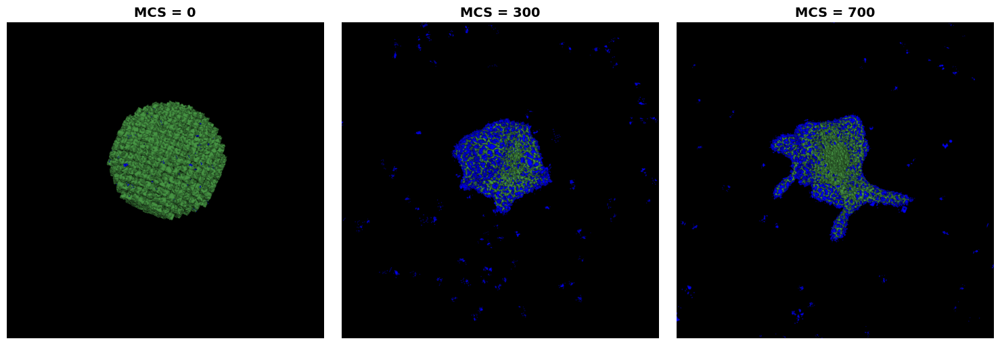

Saved:
  /Users/sheriffakeeb/Desktop/TumorInvasion/Results/Figures/S1_Fig.png
  /Users/sheriffakeeb/Desktop/TumorInvasion/Results/Figures/S1_Fig.pdf
  /Users/sheriffakeeb/Desktop/TumorInvasion/Results/Figures/S1_Fig.tif


In [110]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
# import matplotlib as mpl
# mpl.rcParams["font.family"] = "Arial"

def ensure_dirs(path: str) -> None:
    os.makedirs(path, exist_ok=True)

def load_images(base_path, filenames):
    imgs = []
    for f in filenames:
        p = os.path.join(base_path, f)
        if not os.path.exists(p):
            raise FileNotFoundError(f"Image not found: {p}")
        imgs.append(mpimg.imread(p))
    return imgs

def save_tif_lzw_from_plt(fig, tif_path, dpi=300, bbox_inches="tight", pad_inches=0.0):
    try:
        fig.savefig(
            tif_path,
            dpi=dpi,
            bbox_inches=bbox_inches,
            pad_inches=pad_inches,
            pil_kwargs={"compression": "tiff_lzw"}
        )
        return
    except TypeError:
        pass
    from PIL import Image
    import tempfile

    with tempfile.TemporaryDirectory() as td:
        tmp_png = os.path.join(td, "tmp_render.png")
        fig.savefig(tmp_png, dpi=dpi, bbox_inches=bbox_inches, pad_inches=pad_inches)
        img = Image.open(tmp_png)
        if img.mode not in ("RGB", "L"):
            img = img.convert("RGB")

        img.save(tif_path, compression="tiff_lzw", dpi=(dpi, dpi))

def main():
    # ----- Paths -----
    base_dir = os.getcwd()
    base_path = os.path.join("..", "..", "Results", "Sample", "3D_Spheroid_Sample")
    out_path = os.path.abspath(os.path.join(base_dir, "../../Results/Figures"))
    ensure_dirs(out_path)

    # ----- Inputs -----
    image_files = ["3D_0000.png", "3D_0300.png", "3D_0700.png"]
    titles = ["MCS = 0", "MCS = 300", "MCS = 700"]

    # ----- Load -----
    imgs = load_images(base_path, image_files)

    # ----- Figure -----
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))  # 15x5 inches; at 300 dpi, 4500x1500 px render

    for ax, img, title in zip(axs, imgs, titles):
        ax.imshow(img)
        ax.set_title(title, fontsize=14, weight="bold")
        ax.axis("off")
        ax.set_box_aspect(1)  # make each panel square-ish; remove if you want original aspect

    plt.tight_layout()

    # ----- Outputs -----
    png_path  = os.path.join(out_path, "S1_Fig.png")
    pdf_path  = os.path.join(out_path, "S1_Fig.pdf")
    tif_path  = os.path.join(out_path, "S1_Fig.tif")  # .tif extension as requested

    # Save PNG and PDF normally
    fig.savefig(png_path, dpi=300, bbox_inches="tight", pad_inches=0.0)
    fig.savefig(pdf_path, bbox_inches="tight", pad_inches=0.0)  # vector

    # Save TIF with LZW compression (RGB, 300 dpi)
    save_tif_lzw_from_plt(fig, tif_path, dpi=300, bbox_inches="tight", pad_inches=0.0)

    plt.show()

    print("Saved:")
    print(" ", png_path)
    print(" ", pdf_path)
    print(" ", tif_path)

if __name__ == "__main__":
    main()


### Supp Fig 2-6 - Invasion Metrics 

In [111]:
from PIL import Image, ImageChops
import matplotlib.pyplot as plt
import os

# === Base Directories ===
base_dir = os.getcwd()
root_3d = os.path.abspath(os.path.join(base_dir, "../../Results/Plots/Invasion_Metrics_Plots/3D_plot"))
root_2d = os.path.abspath(os.path.join(base_dir, "../../Results/Plots/Invasion_Metrics_Plots/2D_plot"))
output_dir = os.path.abspath(os.path.join(base_dir, "../../Results/Figures"))
os.makedirs(output_dir, exist_ok=True)

# === Metrics and labels ===
# (metric_folder_stub, letter_label)
metrics = [
    ("Clusters", "E"),
    ("Fingers", "D"),
    ("Infiltrative_Area", "B"),
    ("Invasive_Area", "A"),
    ("Singles", "C"),
]

# === Map metric ===
metric_to_basename = {
    "Invasive_Area":      "S2_Fig",
    "Infiltrative_Area":  "S3_Fig",
    "Singles":            "S4_Fig",
    "Fingers":            "S5_Fig",
    "Clusters":           "S6_Fig",
}

# === Options ===
include_label = False        # set True to draw text label onto the combined figure
use_letter_label = False     # if include_label, choose "A/B/C..." + metric vs metric only
DPI = 300                    # export DPI

def trim_whitespace(image: Image.Image) -> Image.Image:
    bg = Image.new(image.mode, image.size, (255, 255, 255))
    diff = ImageChops.difference(image, bg)
    bbox = diff.getbbox()
    return image.crop(bbox) if bbox else image

def save_tif_lzw_from_fig(fig, path_tif, dpi=300, bbox_inches="tight", pad_inches=0.0):
    try:
        fig.savefig(
            path_tif,
            dpi=dpi,
            bbox_inches=bbox_inches,
            pad_inches=pad_inches,
            pil_kwargs={"compression": "tiff_lzw"}
        )
        return
    except TypeError:
        pass  
    import tempfile
    tmpdir = tempfile.mkdtemp(prefix="tif_lzw_")
    tmp_png = os.path.join(tmpdir, "tmp.png")
    fig.savefig(tmp_png, dpi=dpi, bbox_inches=bbox_inches, pad_inches=pad_inches)

    from PIL import Image
    img = Image.open(tmp_png)
    if img.mode not in ("RGB", "L"):
        img = img.convert("RGB")  # ensure RGB
    img.save(path_tif, compression="tiff_lzw", dpi=(dpi, dpi))

    try:
        os.remove(tmp_png)
        os.rmdir(tmpdir)
    except Exception:
        pass

for metric, letter in metrics:
    img_3d_path = os.path.join(root_3d, f"{metric}_3D_Cube.png")
    img_2d_path = os.path.join(root_2d, f"{metric}_2D_Stacked.png")

    if not os.path.exists(img_3d_path):
        raise FileNotFoundError(f"Missing 3D image: {img_3d_path}")
    if not os.path.exists(img_2d_path):
        raise FileNotFoundError(f"Missing 2D image: {img_2d_path}")

    img_3d = Image.open(img_3d_path).convert("RGB")
    img_2d = Image.open(img_2d_path).convert("RGB")

    img_3d = trim_whitespace(img_3d)
    img_2d = trim_whitespace(img_2d)

    # --- Scale 2D to match 3D height ---
    new_width_2d = int(img_2d.width * (img_3d.height / img_2d.height))
    img_2d_scaled = img_2d.resize((new_width_2d, img_3d.height), Image.Resampling.LANCZOS)

    # --- Compose side-by-side with a small gap ---
    gap = 40  # positive = gap; negative would overlap
    total_width = img_3d.width + img_2d_scaled.width + gap
    total_height = img_3d.height
    combined_img = Image.new("RGB", (total_width, total_height), color=(255, 255, 255))
    combined_img.paste(img_3d, (0, 0))
    combined_img.paste(img_2d_scaled, (img_3d.width + gap, 0))

    # --- Render with Matplotlib for optional label and precise export ---
    fig_w_in = total_width / DPI
    fig_h_in = total_height / DPI
    fig = plt.figure(figsize=(fig_w_in, fig_h_in), dpi=DPI)
    ax = plt.axes([0, 0, 1, 1])   # full-bleed axis
    ax.imshow(combined_img)
    ax.axis("off")

    if include_label:
        label_text = f"{letter}: {metric.replace('_', ' ')}" if use_letter_label else metric.replace("_", " ")
        ax.text(
            10, 60, label_text,
            fontsize=90, fontweight="bold", color="black",
            bbox=dict(facecolor="white", edgecolor="none", pad=8, alpha=0.9),
            ha="left", va="top", transform=ax.transData
        )

    # --- Output base name from mapping ---
    base_name = metric_to_basename.get(metric, metric)  # fallback: metric
    out_base = os.path.join(output_dir, base_name)

    # --- Save PNG and PDF ---
    png_path = out_base + ".png"
    pdf_path = out_base + ".pdf"
    fig.savefig(png_path, dpi=DPI, bbox_inches="tight", pad_inches=0.0)
    fig.savefig(pdf_path, dpi=DPI, bbox_inches="tight", pad_inches=0.0)

    # --- Save TIF (.tif) with LZW compression ---
    tif_path = out_base + ".tif"
    save_tif_lzw_from_fig(fig, tif_path, dpi=DPI, bbox_inches="tight", pad_inches=0.0)

    plt.close(fig)
    print(f"✅ Done: {base_name} -> {png_path}, {pdf_path}, {tif_path}")


✅ Done: S6_Fig -> /Users/sheriffakeeb/Desktop/TumorInvasion/Results/Figures/S6_Fig.png, /Users/sheriffakeeb/Desktop/TumorInvasion/Results/Figures/S6_Fig.pdf, /Users/sheriffakeeb/Desktop/TumorInvasion/Results/Figures/S6_Fig.tif
✅ Done: S5_Fig -> /Users/sheriffakeeb/Desktop/TumorInvasion/Results/Figures/S5_Fig.png, /Users/sheriffakeeb/Desktop/TumorInvasion/Results/Figures/S5_Fig.pdf, /Users/sheriffakeeb/Desktop/TumorInvasion/Results/Figures/S5_Fig.tif
✅ Done: S3_Fig -> /Users/sheriffakeeb/Desktop/TumorInvasion/Results/Figures/S3_Fig.png, /Users/sheriffakeeb/Desktop/TumorInvasion/Results/Figures/S3_Fig.pdf, /Users/sheriffakeeb/Desktop/TumorInvasion/Results/Figures/S3_Fig.tif
✅ Done: S2_Fig -> /Users/sheriffakeeb/Desktop/TumorInvasion/Results/Figures/S2_Fig.png, /Users/sheriffakeeb/Desktop/TumorInvasion/Results/Figures/S2_Fig.pdf, /Users/sheriffakeeb/Desktop/TumorInvasion/Results/Figures/S2_Fig.tif
✅ Done: S4_Fig -> /Users/sheriffakeeb/Desktop/TumorInvasion/Results/Figures/S4_Fig.png, /Use

### Supp Fig 7 - Sensitivity Analysis

In [112]:
from PIL import Image, ImageDraw, ImageFont
import os, re

# ---------------------------------------
# INPUTS (edit if your paths are different)
# ---------------------------------------
heatmap_path = "../../Results/Plots/parameter_sensitivity_outputs/distancecorr_heatmap.png"       # panel A
bar_path     = "../../Results/Plots/parameter_sensitivity_outputs/importance_random_forest.png"   # panel B
out_path     = "../../Results/Figures/Supp_Fig7_sensitivity.png"  # ORIGINAL target (used to infer S#)

# Layout: "h" = horizontal (A | B), "v" = vertical (A over B)
layout = "h"

# Canvas & label styling
gap_px      = 40          # gap between images
side_pad    = 30          # left/right padding
top_pad     = 24          # top padding
bottom_pad  = 24          # bottom padding
label_size  = 72          # label font size
label_pad   = 16          # inset from each panel's top-left corner
label_fill  = (0, 0, 0)   # black text
label_stroke_fill = (255, 255, 255)  # white outline for readability
label_stroke_width = 4

# ---------------------------------------
# Ensure output folder exists and compute accepted S#_Fig.* names
# ---------------------------------------
os.makedirs(os.path.dirname(out_path) or ".", exist_ok=True)

# Parse a number from the provided out_path (e.g., "Supp_Fig7...", "Supp-Fig07", etc.)
m = re.search(r"Supp[_\- ]*Fig\s*0*(\d+)", os.path.basename(out_path), flags=re.IGNORECASE)
supp_num = int(m.group(1)) if m else 1
accepted_base = os.path.join(os.path.dirname(out_path), f"S{supp_num}_Fig")

png_path  = accepted_base + ".png"
pdf_path  = accepted_base + ".pdf"
tif_path  = accepted_base + ".tif"   # <- .tif extension (PLOS-accepted)

# ---------------------------------------
# Load images
# ---------------------------------------
imgA = Image.open(heatmap_path).convert("RGB")  # A: heatmap
imgB = Image.open(bar_path).convert("RGB")      # B: importance bar

# ---------------------------------------
# Make the two panels the same height (h) or width (v)
# ---------------------------------------
if layout.lower() == "h":
    target_h = max(imgA.height, imgB.height)

    def _resize_to_h(im, H):
        if im.height == H:
            return im
        W = int(im.width * (H / im.height))
        return im.resize((W, H), Image.LANCZOS)

    A = _resize_to_h(imgA, target_h)
    B = _resize_to_h(imgB, target_h)

    canvas_w = side_pad + A.width + gap_px + B.width + side_pad
    canvas_h = top_pad + target_h + bottom_pad
    canvas = Image.new("RGB", (canvas_w, canvas_h), "white")

    # Paste images
    canvas.paste(A, (side_pad, top_pad))
    canvas.paste(B, (side_pad + A.width + gap_px, top_pad))

    # Label positions (inside each panel, top-left)
    label_pos_A = (side_pad + label_pad, top_pad + label_pad)
    label_pos_B = (side_pad + A.width + gap_px + label_pad, top_pad + label_pad)

else:  # vertical layout
    target_w = max(imgA.width, imgB.width)

    def _resize_to_w(im, W):
        if im.width == W:
            return im
        H = int(im.height * (W / im.width))
        return im.resize((W, H), Image.LANCZOS)

    A = _resize_to_w(imgA, target_w)
    B = _resize_to_w(imgB, target_w)

    canvas_w = side_pad + target_w + side_pad
    canvas_h = top_pad + A.height + gap_px + B.height + bottom_pad
    canvas = Image.new("RGB", (canvas_w, canvas_h), "white")

    # Paste images
    canvas.paste(A, (side_pad, top_pad))
    canvas.paste(B, (side_pad, top_pad + A.height + gap_px))

    # Label positions
    label_pos_A = (side_pad + label_pad, top_pad + label_pad)
    label_pos_B = (side_pad + label_pad, top_pad + A.height + gap_px + label_pad)

# ---------------------------------------
# Draw bold panel letters
# ---------------------------------------
draw = ImageDraw.Draw(canvas)

def _get_font(sz):
    # Try a few common bold fonts; fall back to default
    for fn in ("DejaVuSans-Bold.ttf", "Arial Bold.ttf", "Arial.ttf", "LiberationSans-Bold.ttf"):
        try:
            return ImageFont.truetype(fn, sz)
        except Exception:
            continue
    return ImageFont.load_default()

font = _get_font(label_size)

draw.text(label_pos_A, "A", font=font, fill=label_fill,
          stroke_width=label_stroke_width, stroke_fill=label_stroke_fill)
draw.text(label_pos_B, "B", font=font, fill=label_fill,
          stroke_width=label_stroke_width, stroke_fill=label_stroke_fill)

# ---------------------------------------
# Save PNG, PDF, and TIFF at 300 DPI (TIFF with LZW, .tif)
# ---------------------------------------
canvas.save(png_path, dpi=(300, 300))                 # PNG
canvas.save(pdf_path, "PDF", resolution=300.0)        # PDF
canvas.save(tif_path, compression="tiff_lzw", dpi=(300, 300))  # TIF (LZW)

print("Saved combined figure:")
print("  PNG :", png_path)
print("  PDF :", pdf_path)
print("  TIF :", tif_path)


Saved combined figure:
  PNG : ../../Results/Figures/S7_Fig.png
  PDF : ../../Results/Figures/S7_Fig.pdf
  TIF : ../../Results/Figures/S7_Fig.tif


### Supp Fig 8 - Phenotype  Phase Space (3D and 2D slices)

In [113]:
import matplotlib.pyplot as plt
from PIL import Image
import os, re

cwd = os.getcwd()
project_root = os.path.abspath(os.path.join(cwd, '..', '..'))

# Load images
img_3d = Image.open(os.path.join(project_root, "Results", "Plots", "Phenotypes", "PhaseSpace_By_MCS", "phenotype_phase_space_mcs_700.png"))
img_slice_phenotype = Image.open(os.path.join(project_root, "Results", "Plots", "Phenotypes", "2D_Phenotype", "Migration_vs_Adhesion", "2d_adhesion_vs_migration_MCS_700.png"))
img_slice_migration = Image.open(os.path.join(project_root, "Results", "Plots", "Phenotypes", "2D_Phenotype", "Migration_vs_Proliferation", "2d_migration_vs_proliferation_MCS_700.png"))
img_slice_adhesion = Image.open(os.path.join(project_root, "Results", "Plots", "Phenotypes", "2D_Phenotype", "Adhesion_vs_Proliferation", "2d_adhesion_vs_proliferation_MCS_700.png"))

# Resize 2D slices to the same width
target_width = 1000
def resize_keep_aspect(img, width):
    wpercent = width / float(img.width)
    hsize = int(float(img.height) * wpercent)
    return img.resize((width, hsize), Image.Resampling.LANCZOS)

img_slice_phenotype = resize_keep_aspect(img_slice_phenotype, target_width)
img_slice_migration = resize_keep_aspect(img_slice_migration, target_width)
img_slice_adhesion = resize_keep_aspect(img_slice_adhesion, target_width)

# Create a white padding between slices
padding_height = 20  # adjust spacing height here
padding_color = (255, 255, 255)
padding = Image.new("RGB", (target_width, padding_height), padding_color)

# Stack 2D slices with padding
stack_list = [
    img_slice_phenotype,
    padding,
    img_slice_migration,
    padding,
    img_slice_adhesion
]

total_height = sum(im.height for im in stack_list)
stacked_2d = Image.new("RGB", (target_width, total_height), "white")
y_offset = 0
for im in stack_list:
    stacked_2d.paste(im, (0, y_offset))
    y_offset += im.height

# Resize the 3D plot to match the stacked height (maintaining aspect ratio)
aspect_ratio = img_3d.width / img_3d.height
new_3d_height = total_height
new_3d_width = int(aspect_ratio * new_3d_height)
img_3d_resized = img_3d.resize((new_3d_width, new_3d_height), Image.Resampling.LANCZOS)

# Combine the 3D and stacked 2D plots side by side
combined_width = new_3d_width + target_width
combined_img = Image.new("RGB", (combined_width, total_height), "white")
combined_img.paste(img_3d_resized, (0, 0))
combined_img.paste(stacked_2d, (new_3d_width, 0))

# Output dir
out_dir = os.path.join(project_root, "Results", "Figures")
os.makedirs(out_dir, exist_ok=True)

# Original (human) name — used only to infer the S# below
human_name = "Supp_fig8_phenotype_phase_space"

# Derive PLOS-accepted base name: S{N}_Fig
m = re.search(r"Supp[_\- ]*fig\s*0*(\d+)", human_name, flags=re.IGNORECASE)
supp_num = int(m.group(1)) if m else 1
accepted_base = f"S{supp_num}_Fig"

# Final accepted paths
png_path  = os.path.join(out_dir, accepted_base + ".png")
pdf_path  = os.path.join(out_dir, accepted_base + ".pdf")
tif_path  = os.path.join(out_dir, accepted_base + ".tif")  # .tif + LZW

# Save (300 dpi); PDF uses resolution kwarg, TIF uses LZW compression
combined_img.save(png_path, dpi=(300, 300))                         # PNG
combined_img.save(pdf_path, "PDF", resolution=300.0)                # PDF
combined_img.save(tif_path, compression="tiff_lzw", dpi=(300, 300)) # TIF (LZW)

print("Saved combined figure:")
print("  -", png_path)
print("  -", pdf_path)
print("  -", tif_path)


Saved combined figure:
  - /Users/sheriffakeeb/Desktop/TumorInvasion/Results/Figures/S8_Fig.png
  - /Users/sheriffakeeb/Desktop/TumorInvasion/Results/Figures/S8_Fig.pdf
  - /Users/sheriffakeeb/Desktop/TumorInvasion/Results/Figures/S8_Fig.tif


### Supp Fig 9 - Cluster Dynamics

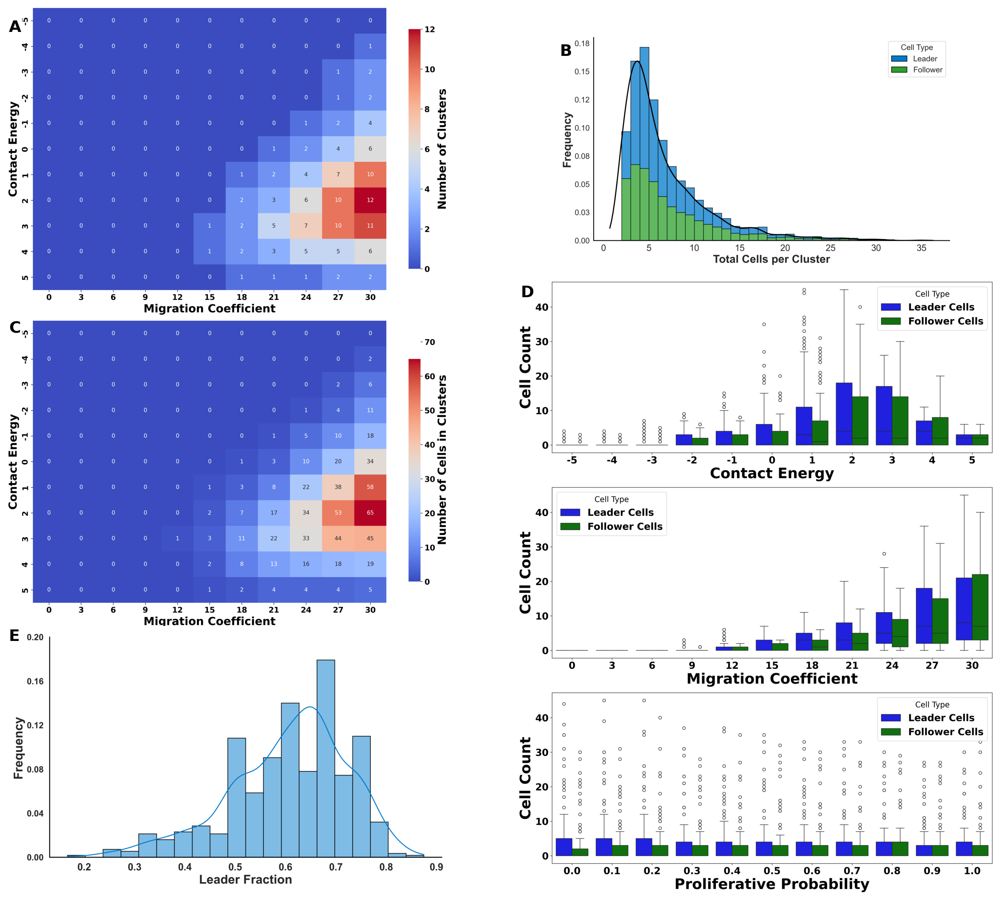

Saved:
  ../../Results/Figures/S9_Fig.png
  ../../Results/Figures/S9_Fig.pdf
  ../../Results/Figures/S9_Fig.tif


In [114]:
import matplotlib.pyplot as plt
from PIL import Image
import os, re, tempfile

# === Load images ===
image_paths = [
    "../../Results/Plots/cluster_plots/Heatmaps/total_clusters_heatmap.png",                      # A
    "../../Results/Plots/cluster_plots/Histogram/cluster_total_cells_hist.png",                   # B
    "../../Results/Plots/cluster_plots/Heatmaps/total_cells_heatmap.png",                         # C
    "../../Results/Plots/cluster_plots/Violin_Plots/leader_follower_plots/leader_follower_per_cluster.png",  # D
    "../../Results/Plots/cluster_plots/Histogram/leader_fraction_histogram.png"                  # E
]
images = [Image.open(path).convert("RGB") for path in image_paths]

# === Create figure ===
fig = plt.figure(figsize=(24, 30))

# === Column 1: tightly stacked ===
ax_A = fig.add_axes([0.05, 0.705, 0.42, 0.255])  # A
ax_C = fig.add_axes([0.05, 0.47, 0.42, 0.255])   # C
ax_E = fig.add_axes([0.05, 0.255, 0.42, 0.255])  # E

# === Column 2: B smaller, D larger ===
ax_B = fig.add_axes([0.53, 0.75, 0.45, 0.18])    # B (smaller height)
ax_D = fig.add_axes([0.53, 0.235, 0.45, 0.555])  # D (taller height)

# === Axes and Labels ===
axes  = [ax_A, ax_B, ax_C, ax_D, ax_E]
labels = ["A", "B", "C", "D", "E"]
label_positions = [(0.01, 0.95)] * 2 + [(0.01, 0.99)] * 3

for ax, img, label, pos in zip(axes, images, labels, label_positions):
    ax.imshow(img)
    ax.text(
        pos[0], pos[1], label, transform=ax.transAxes,
        fontsize=26, fontweight='bold', ha='left', va='top',
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.6)
    )
    ax.axis("off")

# === Output naming: parse Supp_fig# -> S#_Fig ===
human_base = "../../Results/Figures/Supp_fig9_cluster_dynamics"
out_dir = os.path.dirname(human_base)
os.makedirs(out_dir, exist_ok=True)

m = re.search(r"Supp[_\- ]*fig\s*0*(\d+)", os.path.basename(human_base), flags=re.IGNORECASE)
supp_num = int(m.group(1)) if m else 1
accepted_base = os.path.join(out_dir, f"S{supp_num}_Fig")

png_path = accepted_base + ".png"
pdf_path = accepted_base + ".pdf"
tif_path = accepted_base + ".tif"  # .tif (not .tiff)

# === Save PNG and PDF ===
plt.savefig(png_path, dpi=300, bbox_inches='tight', pad_inches=0.0)
plt.savefig(pdf_path,            bbox_inches='tight', pad_inches=0.0)  # vector

# === Save TIF with LZW (try pil_kwargs; fallback to Pillow conversion) ===
try:
    plt.savefig(
        tif_path, dpi=300, bbox_inches='tight', pad_inches=0.0,
        pil_kwargs={"compression": "tiff_lzw"}
    )
except TypeError:
    # Older Matplotlib: no pil_kwargs. Save temp PNG then convert via Pillow.
    with tempfile.TemporaryDirectory() as td:
        tmp_png = os.path.join(td, "tmp.png")
        plt.savefig(tmp_png, dpi=300, bbox_inches='tight', pad_inches=0.0)
        img = Image.open(tmp_png)
        if img.mode not in ("RGB", "L"):
            img = img.convert("RGB")
        img.save(tif_path, compression="tiff_lzw", dpi=(300, 300))

plt.show()

print("Saved:")
print(" ", png_path)
print(" ", pdf_path)
print(" ", tif_path)


### Supp Fig 10 - Cluster Trajectory

In [ ]:
import os, math, io
from ast import literal_eval
from pathlib import Path
from typing import List, Iterable, Optional, Tuple, Dict

import numpy as np
import pandas as pd

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
from matplotlib.lines import Line2D
from matplotlib.legend_handler import HandlerBase
from mpl_toolkits.axes_grid1 import make_axes_locatable  # for colorbar axis
from matplotlib import animation

from PIL import Image

# imageio is optional; if unavailable we'll try Matplotlib-FFmpeg, else PNG sequence + ffmpeg cmd
try:
    import imageio.v2 as imageio
    HAS_IMAGEIO = True
except Exception:
    imageio = None
    HAS_IMAGEIO = False

import ipywidgets as widgets
from IPython.display import display, clear_output

# --------------------------------
# Matplotlib settings
# --------------------------------
plt.ioff()
mpl.rcParams["pdf.fonttype"] = 42
mpl.rcParams["ps.fonttype"]  = 42

# =============================
# CONFIG
# =============================
COMPOSITION_CSV = "../../Results/Data/Clusters/ClusterComposition_1.csv"
SAVE_DIR        = "../../Results/Data/Clusters/Trajectory"
Path(SAVE_DIR).mkdir(parents=True, exist_ok=True)

APP_TITLE       = "Cluster Trajectories (TrackID & UID side-by-side)"

# Fixed scale per selection so full trajectory stays visible while animating
MIN_X_SPAN = 50.0
MIN_Y_SPAN = 5.0
PAD_FRAC   = 0.02

# Tracker thresholds (only needed for TrackID view’s linker)
JACCARD_MIN       = 0.15
CENTROID_MAX_DIST = 10.0

# Styling
LINE_WIDTH   = 2
DOT_SIZE     = 28      # points^2
START_SIZE   = 180
END_SIZE     = 220     # mapped to markersize for ax.plot
TEXT_FONT_SZ = 9

# Legend placement (outside, after colorbar)
LEGEND_ANCHOR_X = 1.20
LEGEND_ANCHOR_Y = 0.5

# ===== Font knobs =====
AXIS_LABEL_FONTSIZE       = 14
AXIS_LABEL_FONTWEIGHT     = "bold"

TICK_LABEL_FONTSIZE       = 12
TICK_LABEL_FONTWEIGHT     = "bold"

COLORBAR_LABEL_FONTSIZE   = 13
COLORBAR_LABEL_FONTWEIGHT = "bold"
COLORBAR_TICK_FONTSIZE    = 11
COLORBAR_TICK_FONTWEIGHT  = "bold"

LEGEND_FONTSIZE           = 12
LEGEND_FONTWEIGHT         = "bold"

DPI_EXPORT = 300  # for PNG/PDF/TIF

# =============================
# Custom legend handler for dotted "X"
# =============================
class HandlerDottedCross(HandlerBase):
    def create_artists(self, legend, orig_handle,
                       xdescent, ydescent, width, height, fontsize, trans):
        x0 = width / 2
        y0 = height / 2
        dx = width / 2
        dy = height / 2
        line1 = plt.Line2D([x0 - dx, x0 + dx],
                           [y0 - dy, y0 + dy],
                           linestyle=":", color=orig_handle.get_color(),
                           linewidth=orig_handle.get_linewidth(), transform=trans)
        line2 = plt.Line2D([x0 - dx, x0 + dx],
                           [y0 + dy, y0 - dy],
                           linestyle=":", color=orig_handle.get_color(),
                           linewidth=orig_handle.get_linewidth(), transform=trans)
        return [line1, line2]

# Dummy handle to carry style for legend entry
dotted_cross_handle = Line2D([], [], color="black", lw=2, label="End (700 MCS)")

# =============================
# Helpers
# =============================
def parse_list(s):
    if pd.isna(s):
        return []
    try:
        v = literal_eval(str(s))
        if isinstance(v, (list, tuple)):
            return [float(x) for x in v]
    except Exception:
        pass
    return []

def row_points(row, round_dec=1):
    lx = parse_list(row.get("Member_Leader_X"))
    ly = parse_list(row.get("Member_Leader_Y"))
    fx = parse_list(row.get("Member_Follower_X"))
    fy = parse_list(row.get("Member_Follower_Y"))
    pts = [(x, y) for x, y in zip(lx, ly)] + [(x, y) for x, y in zip(fx, fy)]
    if not pts:
        return np.empty((0, 2), dtype=float)
    pts = np.asarray(pts, dtype=float)
    return np.round(pts, round_dec) if round_dec is not None else pts

def jaccard_from_points(A, B):
    if A.size == 0 or B.size == 0:
        return 0.0
    sA, sB = set(map(tuple, A)), set(map(tuple, B))
    inter, uni = len(sA & sB), len(sA | sB)
    return 0.0 if uni == 0 else inter / uni

def centroid_from_points(pts):
    if pts.size == 0:
        return np.nan, np.nan
    return float(np.mean(pts[:, 0])), float(np.mean(pts[:, 1]))

def color_cycle(n):
    cmaps = ["tab10", "tab20", "tab20b", "tab20c", "Set3", "Accent", "Dark2", "Paired"]
    cols, idx = [], 0
    while len(cols) < n:
        cmap = plt.get_cmap(cmaps[idx % len(cmaps)])
        steps = 20 if "tab20" in cmap.name else 10
        for i in range(steps):
            if len(cols) >= n:
                break
            cols.append(cmap(i / max(1, steps - 1)))
        idx += 1
    return cols[:n]

def _sorted_unique(series):
    vals = list({float(x) for x in series.dropna().tolist()})
    vals.sort()
    return vals

def _sanitize(s: str) -> str:
    return "".join(ch if ch.isalnum() or ch in "._-=" else "_" for ch in str(s))

def _ffmpeg_available() -> bool:
    try:
        return animation.writers.is_available("ffmpeg")
    except Exception:
        return False

# -------- SUPER-ROBUST dropdown setter ----------
def _set_dropdown(drop: widgets.Dropdown, options, prefer_keep=True):
    prev = drop.value
    values = [v for (_, v) in options]
    try:
        drop.value = None
    except Exception:
        pass
    drop.options = options
    if prefer_keep and (prev in values):
        drop.value = prev
    else:
        drop.value = (values[0] if values else None)
# ------------------------------------------------

# Safely set slider+play ranges in order (max → min → step → value)
def _set_range_widgets(slider: widgets.IntSlider, play: widgets.Play,
                       vmin: int, vmax: int, step: int, start_value: int = None):
    if vmin > vmax:
        vmin, vmax = vmax, vmin
    val = vmin if start_value is None else max(vmin, min(start_value, vmax))

    slider.unobserve(_on_slider_change, names="value")
    try:
        slider.max = int(vmax)
        slider.min = int(vmin)
        slider.step = int(step)
        slider.value = int(val)

        play.max = int(vmax)
        play.min = int(vmin)
        play.step = int(step)
        play.value = int(val)
    finally:
        slider.observe(_on_slider_change, names="value")

# =============================
# TrackID trajectory builder
# =============================
def build_tracks_df(df, jlf, mu, pp, rep,
                    jaccard_min=JACCARD_MIN, centroid_max_dist=CENTROID_MAX_DIST):
    sub = df[(df["Jlf"] == jlf) & (df["mu"] == mu) & (df["PP"] == pp) & (df["rep"] == rep)].copy()
    if sub.empty:
        return pd.DataFrame(columns=["MCS","Cluster ID","TrackID","centroid_x_fix","centroid_y_fix","TotalCells"])
    sub = sub.sort_values(["MCS", "Cluster ID"]).reset_index(drop=True)

    time_points = sorted(sub["MCS"].unique())
    track_id_counter = 1
    active_tracks = []  # [{'track': int, 'points': Nx2, 'centroid': (x,y)}]
    assignments = []

    for t in time_points:
        cur = sub[sub["MCS"] == t].copy()
        cur["pts"] = cur.apply(row_points, axis=1)
        cur["centroid_from_pts"] = cur["pts"].apply(centroid_from_points)

        unmatched = set(cur.index.tolist())
        used_tracks = set()

        # 1) Jaccard match
        for ci in list(unmatched):
            row_pts = cur.at[ci, "pts"]
            best_track, best_j = None, -1.0
            for tr in active_tracks:
                if tr["track"] in used_tracks:
                    continue
                j = jaccard_from_points(row_pts, tr["points"])
                if j > best_j:
                    best_j, best_track = j, tr
            if best_track is not None and best_j >= jaccard_min:
                cx, cy = cur.at[ci, "centroid_from_pts"]
                if np.isnan(cx) or np.isnan(cy):
                    cx, cy = float(cur.at[ci, "Centroid_X"]), float(cur.at[ci, "Centroid_Y"])
                assignments.append({
                    "MCS": t,
                    "Cluster ID": cur.at[ci, "Cluster ID"],
                    "TrackID": best_track["track"],
                    "centroid_x_fix": cx,
                    "centroid_y_fix": cy,
                    "TotalCells": float(cur.at[ci, "Total Cells"]) if "Total Cells" in cur.columns else np.nan
                })
                best_track["points"] = row_pts
                best_track["centroid"] = (cx, cy)
                unmatched.remove(ci)
                used_tracks.add(best_track["track"])

        # 2) Centroid distance match
        for ci in list(unmatched):
            cx, cy = cur.at[ci, "centroid_from_pts"]
            if np.isnan(cx) or np.isnan(cy):
                cx, cy = float(cur.at[ci, "Centroid_X"]), float(cur.at[ci, "Centroid_Y"])
            best_track, best_dist = None, float("inf")
            for tr in active_tracks:
                if tr["track"] in used_tracks:
                    continue
                tx, ty = tr["centroid"]
                if tx is None or np.isnan(tx) or ty is None or np.isnan(ty):
                    continue
                d = math.hypot(cx - tx, cy - ty)
                if d < best_dist:
                    best_dist, best_track = d, tr
            if best_track is not None and best_dist <= centroid_max_dist:
                assignments.append({
                    "MCS": t,
                    "Cluster ID": cur.at[ci, "Cluster ID"],
                    "TrackID": best_track["track"],
                    "centroid_x_fix": cx,
                    "centroid_y_fix": cy,
                    "TotalCells": float(cur.at[ci, "Total Cells"]) if "Total Cells" in cur.columns else np.nan
                })
                best_track["points"] = cur.at[ci, "pts"]
                best_track["centroid"] = (cx, cy)
                unmatched.remove(ci)
                used_tracks.add(best_track["track"])

        # 3) New tracks
        for ci in list(unmatched):
            cx, cy = cur.at[ci, "centroid_from_pts"]
            if np.isnan(cx) or np.isnan(cy):
                cx, cy = float(cur.at[ci, "Centroid_X"]), float(cur.at[ci, "Centroid_Y"])
            tr = {"track": track_id_counter, "points": cur.at[ci, "pts"], "centroid": (cx, cy)}
            active_tracks.append(tr)
            assignments.append({
                "MCS": t,
                "Cluster ID": cur.at[ci, "Cluster ID"],
                "TrackID": track_id_counter,
                "centroid_x_fix": cx,
                "centroid_y_fix": cy,
                "TotalCells": float(cur.at[ci, "Total Cells"]) if "Total Cells" in cur.columns else np.nan
            })
            track_id_counter += 1

    tracks_df = pd.DataFrame(assignments).sort_values(["TrackID","MCS"]).reset_index(drop=True)
    return tracks_df

# =============================
# UID trajectory builder
# =============================
def build_tracks_df_uid(df, jlf, mu, pp, rep):
    sub = df[(df["Jlf"] == jlf) & (df["mu"] == mu) & (df["PP"] == pp) & (df["rep"] == rep)].copy()
    if sub.empty:
        return pd.DataFrame(columns=["MCS", "Cluster UID", "centroid_x_fix", "centroid_y_fix", "TotalCells"])

    sub["Cluster UID"] = sub["Cluster UID"].astype(str)

    pts = sub.apply(row_points, axis=1)
    cents = pts.apply(centroid_from_points)
    sub["centroid_x_fix"] = [cx if not np.isnan(cx) else float(x) for (cx, _), x in zip(cents, sub["Centroid_X"])]
    sub["centroid_y_fix"] = [cy if not np.isnan(cy) else float(y) for (_, cy), y in zip(cents, sub["Centroid_Y"])]

    out_cols = ["MCS", "Cluster UID", "centroid_x_fix", "centroid_y_fix", "Total Cells"]
    tracks = sub[out_cols].rename(columns={"Total Cells": "TotalCells"}).copy()
    tracks = tracks.sort_values(["Cluster UID", "MCS"]).reset_index(drop=True)
    return tracks

# =============================
# UID ↔ TrackID color mapping helper
# =============================
def _uid_to_tid_map_for_params(df, jlf, mu, pp, rep, tracks_df):
    sub = df[(df["Jlf"] == jlf) & (df["mu"] == mu) & (df["PP"] == pp) & (df["rep"] == rep)].copy()
    if sub.empty or tracks_df is None or tracks_df.empty:
        return {}

    sub = sub[["MCS", "Cluster ID", "Cluster UID"]].copy()
    sub["Cluster UID"] = sub["Cluster UID"].astype(str)

    merged = pd.merge(
        tracks_df[["MCS", "Cluster ID", "TrackID"]],
        sub,
        on=["MCS", "Cluster ID"],
        how="left"
    )

    uid_to_tid = {}
    for uid, g in merged.dropna(subset=["Cluster UID"]).groupby("Cluster UID"):
        mode_vals = g["TrackID"].mode()
        if not mode_vals.empty:
            uid_to_tid[uid] = int(mode_vals.iloc[0])
    return uid_to_tid

# =============================
# Load data once
# =============================
assert os.path.exists(COMPOSITION_CSV), f"Missing: {COMPOSITION_CSV}"
df = pd.read_csv(COMPOSITION_CSV)

need_tracks = ["MCS","Jlf","mu","PP","rep","Cluster ID",
               "Centroid_X","Centroid_Y",
               "Member_Leader_X","Member_Leader_Y",
               "Member_Follower_X","Member_Follower_Y",
               "Total Cells"]
need_uid    = ["MCS","Jlf","mu","PP","rep","Cluster UID",
               "Centroid_X","Centroid_Y",
               "Member_Leader_X","Member_Leader_Y",
               "Member_Follower_X","Member_Follower_Y",
               "Total Cells"]

missing_tracks = [c for c in need_tracks if c not in df.columns]
missing_uid    = [c for c in need_uid    if c not in df.columns]
if missing_tracks:
    raise ValueError(f"Missing columns for TrackID view in {COMPOSITION_CSV}: {missing_tracks}")
if missing_uid:
    raise ValueError(f"Missing columns for UID view in {COMPOSITION_CSV}: {missing_uid}")

for c in ["MCS","Jlf","mu","PP","rep","Cluster ID","Centroid_X","Centroid_Y","Total Cells"]:
    if c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="coerce")

if "Cluster UID" in df.columns:
    df["Cluster UID"] = df["Cluster UID"].astype(str)

df = df.dropna(subset=["MCS","Jlf","mu","PP","rep"]).copy()

# =============================
# Widgets (shared)
# =============================
jlf_options = _sorted_unique(df["Jlf"])
dd_jlf = widgets.Dropdown(
    options=[(f"{v:g}", v) for v in jlf_options],
    value=(jlf_options[0] if jlf_options else None),
    description="Jlf:",
    layout=widgets.Layout(width="180px"),
)
dd_mu  = widgets.Dropdown(description="μ:", layout=widgets.Layout(width="180px"))
dd_pp  = widgets.Dropdown(description="PP:", layout=widgets.Layout(width="180px"))
dd_rep = widgets.Dropdown(description="rep:", layout=widgets.Layout(width="140px"))

# time slider + play
play       = widgets.Play(interval=300, value=0, min=0, max=1, step=1)
slider     = widgets.IntSlider(value=0, min=0, max=1, step=1, description="MCS", readout=True)
widgets.jslink((play, 'value'), (slider, 'value'))

# Save buttons + status
lbl_status        = widgets.HTML(value="")
btn_save          = widgets.Button(description="Save PNG/PDF/TIF", icon="save", layout=widgets.Layout(width="150px"))
btn_save_all      = widgets.Button(description="Save ALL MCS", icon="save", layout=widgets.Layout(width="140px"))
btn_video_mp4_tr  = widgets.Button(description="MP4 (TrackID)", icon="film", layout=widgets.Layout(width="130px"))
btn_video_mp4_uid = widgets.Button(description="MP4 (UID)",     icon="film", layout=widgets.Layout(width="130px"))
bar_progress      = widgets.IntProgress(value=0, min=0, max=100, bar_style='',
                                        orientation='horizontal',
                                        layout=widgets.Layout(width="260px", visibility="hidden"))
lbl_batch         = widgets.HTML(value="")

# Two outputs (side-by-side canvases)
out_tracks = widgets.Output()   # left: TrackID view
out_uid    = widgets.Output()   # right: UID view

# =============================
# Figure states
# =============================
_state_tracks = dict(
    fig=None, ax=None, cbar=None,
    jlf=None, mu=None, pp=None, rep=None,
    trdf=None, mcs_vals=[], per_tid={}, tids=[],
    colors=[],
    tid_color_map={}   # TrackID -> color
)

_state_uid = dict(
    fig=None, ax=None, cbar=None,
    jlf=None, mu=None, pp=None, rep=None,
    trdf=None, mcs_vals=[], per_uid={}, uids=[],
    colors=[]
)

# =============================
# Limits helper
# =============================
def _compute_limits(trdf):
    xmin = float(trdf["centroid_x_fix"].min()); xmax = float(trdf["centroid_x_fix"].max())
    ymin = float(trdf["centroid_y_fix"].min()); ymax = float(trdf["centroid_y_fix"].max())
    dx = max(xmax - xmin, 0.0); dy = max(ymax - ymin, 0.0)
    eff_x_span = max(MIN_X_SPAN, dx * (1.0 + PAD_FRAC))
    eff_y_span = max(MIN_Y_SPAN, dy * (1.0 + PAD_FRAC))
    x_center = 0.5 * (xmax + xmin) if dx > 0 else xmin
    y_center = 0.5 * (ymax + ymin) if dy > 0 else ymin
    return (x_center - eff_x_span / 2.0, x_center + eff_x_span / 2.0), \
           (y_center - eff_y_span / 2.0, y_center + eff_y_span / 2.0)

# =============================
# INIT + DRAW: TrackID view
# =============================
def _init_tracks():
    with out_tracks:
        clear_output(wait=True)
        if _state_tracks["fig"] is not None:
            try: plt.close(_state_tracks["fig"])
            except: pass

        fig, ax = plt.subplots(figsize=(9.2, 7.6))
        _state_tracks.update(fig=fig, ax=ax, cbar=None)

        jlf, mu, pp, rep = dd_jlf.value, dd_mu.value, dd_pp.value, dd_rep.value
        if None in (jlf, mu, pp, rep):
            ax.set_axis_off(); display(fig); return

        trdf = build_tracks_df(df, jlf, mu, pp, rep)
        if trdf.empty:
            ax.set_axis_off()
            display(fig)
            return

        mcs_vals = sorted(trdf["MCS"].unique())
        tids     = list(trdf["TrackID"].unique())
        colors   = color_cycle(len(tids))
        per_tid  = {tid: trdf[trdf["TrackID"] == tid].sort_values("MCS") for tid in tids}

        _state_tracks.update(jlf=jlf, mu=mu, pp=pp, rep=rep,
                             trdf=trdf, mcs_vals=mcs_vals, per_tid=per_tid,
                             tids=tids, colors=colors)

        _state_tracks["tid_color_map"] = {tid: col for tid, col in zip(tids, colors)}

        (x0, x1), (y0, y1) = _compute_limits(trdf)
        ax.set_xlim(x0, x1); ax.set_ylim(y0, y1)
        ax.set_xlabel("Centroid X", fontsize=AXIS_LABEL_FONTSIZE, fontweight=AXIS_LABEL_FONTWEIGHT)
        ax.set_ylabel("Centroid Y", fontsize=AXIS_LABEL_FONTSIZE, fontweight=AXIS_LABEL_FONTWEIGHT)
        ax.tick_params(axis="both", labelsize=TICK_LABEL_FONTSIZE)
        for lab in ax.get_xticklabels() + ax.get_yticklabels():
            lab.set_fontweight(TICK_LABEL_FONTWEIGHT)

        norm = Normalize(vmin=float(mcs_vals[0]), vmax=float(mcs_vals[-1]))
        sm = ScalarMappable(norm=norm, cmap="viridis")
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="4.5%", pad=0.12)
        cbar = fig.colorbar(sm, cax=cax)
        cbar.set_label("Time (MCS)", fontsize=COLORBAR_LABEL_FONTSIZE, fontweight=COLORBAR_LABEL_FONTWEIGHT)
        cbar.ax.tick_params(labelsize=COLORBAR_TICK_FONTSIZE)
        for t in cbar.ax.get_yticklabels():
            t.set_fontweight(COLORBAR_TICK_FONTWEIGHT)
        _state_tracks["cbar"] = cbar

        legend_elems = [Line2D([0],[0], color=col, lw=LINE_WIDTH, label=f"Cluster {tid}")
                        for tid, col in zip(tids, colors)]
        leg1 = ax.legend(
            handles=legend_elems,
            loc="center left",
            bbox_to_anchor=(LEGEND_ANCHOR_X, LEGEND_ANCHOR_Y),
            borderaxespad=0.0,
            frameon=True,
            prop={"size": LEGEND_FONTSIZE, "weight": LEGEND_FONTWEIGHT},
        )

        marker_handles = [
            Line2D([0], [0], marker='o', color='black', markersize=8,
                   markerfacecolor='none', lw=0, label="Start"),
            Line2D([0], [0], marker='x', color='black', markersize=8,
                   linestyle='None', lw=0, label="End"),
            dotted_cross_handle
        ]
        leg2 = ax.legend(
            handles=marker_handles,
            loc="center left",
            bbox_to_anchor=(LEGEND_ANCHOR_X, LEGEND_ANCHOR_Y - 0.45),
            frameon=True,
            handler_map={dotted_cross_handle: HandlerDottedCross()},
            prop={"size": LEGEND_FONTSIZE, "weight": LEGEND_FONTWEIGHT},
            title_fontsize=LEGEND_FONTSIZE,
        )
        ax.add_artist(leg1)

        _set_range_widgets(slider, play,
                           vmin=int(mcs_vals[0]),
                           vmax=int(mcs_vals[-1]),
                           step=10,
                           start_value=int(mcs_vals[0]))

        _draw_tracks(slider.value)
        display(fig)

def _draw_tracks(mcs_k: int):
    ax = _state_tracks["ax"]; fig = _state_tracks["fig"]
    if ax is None or fig is None:
        return

    # Clear artists (not legends/colorbar)
    for art in list(ax.collections):
        try:
            if getattr(art, 'axes', None) is ax:
                art.remove()
        except Exception: pass
    for line in list(ax.lines):
        try: line.remove()
        except Exception: pass
    for txt in list(ax.texts):
        try: txt.remove()
        except Exception: pass

    mcs_vals = _state_tracks["mcs_vals"]
    if not mcs_vals:
        return
    mcs_k = min(mcs_vals, key=lambda v: abs(v - mcs_k))

    mmin, mmax = float(mcs_vals[0]), float(mcs_vals[-1])
    norm = Normalize(vmin=mmin, vmax=mmax)
    cmap = plt.get_cmap("viridis")

    for tid, col in zip(_state_tracks["tids"], _state_tracks["colors"]):
        g  = _state_tracks["per_tid"][tid]
        gk = g[g["MCS"] <= mcs_k]
        if gk.empty:
            continue

        xs = gk["centroid_x_fix"].to_numpy()
        ys = gk["centroid_y_fix"].to_numpy()
        mcs = gk["MCS"].to_numpy().astype(float)

        # path
        ax.plot(xs, ys, '-', lw=LINE_WIDTH, color=col, alpha=0.9)
        # dots colored by MCS
        colors = cmap(norm(mcs))
        ax.scatter(xs, ys, s=DOT_SIZE, c=colors, edgecolors='none')
        # bold labels
        if "TotalCells" in gk.columns:
            for xi, yi, tc in zip(xs, ys, gk["TotalCells"].tolist()):
                if not (isinstance(tc, float) and math.isnan(tc)) and tc is not None:
                    ax.text(xi, yi + 0.5, f"{int(tc)}",
                            ha="center", va="bottom",
                            fontsize=TEXT_FONT_SZ, fontweight="bold")

        # start marker (open circle)
        ax.scatter([xs[0]], [ys[0]], s=START_SIZE, facecolors='none',
                   edgecolors=col, linewidths=1.8)

        # end marker: dotted X if last MCS==700 else solid 'x'
        end_x, end_y = xs[-1], ys[-1]
        end_mcs = float(mcs[-1])
        if np.isclose(end_mcs, 700.0, atol=1e-6):
            frac = 0.02
            xspan = ax.get_xlim()[1] - ax.get_xlim()[0]
            yspan = ax.get_ylim()[1] - ax.get_ylim()[0]
            dx = frac * xspan
            dy = frac * yspan
            ax.plot([end_x - dx, end_x + dx], [end_y - dy, end_y + dy],
                    linestyle=":", color=col, linewidth=2.0)
            ax.plot([end_x - dx, end_x + dx], [end_y + dy, end_y - dy],
                    linestyle=":", color=col, linewidth=2.0)
        else:
            ax.plot([end_x], [end_y], marker='x', linestyle='None',
                    color=col, markersize=max(6, int(math.sqrt(END_SIZE))),
                    markeredgewidth=2.0)

    ax.tick_params(axis="both", labelsize=TICK_LABEL_FONTSIZE)
    for lab in ax.get_xticklabels() + ax.get_yticklabels():
        lab.set_fontweight(TICK_LABEL_FONTWEIGHT)
    fig.canvas.draw_idle()

# =============================
# INIT + DRAW: UID view
# =============================
def _init_uid():
    with out_uid:
        clear_output(wait=True)
        if _state_uid["fig"] is not None:
            try: plt.close(_state_uid["fig"])
            except: pass

        fig, ax = plt.subplots(figsize=(9.2, 7.6))
        _state_uid.update(fig=fig, ax=ax, cbar=None)

        jlf, mu, pp, rep = dd_jlf.value, dd_mu.value, dd_pp.value, dd_rep.value
        if None in (jlf, mu, pp, rep):
            ax.set_axis_off(); display(fig); return

        trdf = build_tracks_df_uid(df, jlf, mu, pp, rep)
        if trdf.empty:
            ax.set_axis_off()
            display(fig); return

        mcs_vals = sorted(trdf["MCS"].unique())
        uids     = list(trdf["Cluster UID"].unique())
        per_uid  = {uid: trdf[trdf["Cluster UID"] == uid].sort_values("MCS") for uid in uids}

        uid_to_tid = _uid_to_tid_map_for_params(df, jlf, mu, pp, rep, _state_tracks["trdf"])
        tid_color_map = _state_tracks.get("tid_color_map", {})

        uid_colors = [None] * len(uids)
        used_colors = set()
        for i, uid in enumerate(uids):
            tid = uid_to_tid.get(str(uid))
            if tid in tid_color_map:
                uid_colors[i] = tid_color_map[tid]
                used_colors.add(tid_color_map[tid])

        palette   = color_cycle(len(uids) + len(used_colors))
        remaining = [c for c in palette if c not in used_colors]
        rem_iter  = iter(remaining)
        for i, col in enumerate(uid_colors):
            if col is None:
                try:
                    uid_colors[i] = next(rem_iter)
                except StopIteration:
                    uid_colors[i] = color_cycle(1)[0]

        _state_uid.update(jlf=jlf, mu=mu, pp=pp, rep=rep,
                          trdf=trdf, mcs_vals=mcs_vals, per_uid=per_uid,
                          uids=uids, colors=uid_colors)

        (x0, x1), (y0, y1) = _compute_limits(trdf)
        ax.set_xlim(x0, x1); ax.set_ylim(y0, y1)
        ax.set_xlabel("Centroid X", fontsize=AXIS_LABEL_FONTSIZE, fontweight=AXIS_LABEL_FONTWEIGHT)
        ax.set_ylabel("Centroid Y", fontsize=AXIS_LABEL_FONTSIZE, fontweight=AXIS_LABEL_FONTWEIGHT)
        ax.tick_params(axis="both", labelsize=TICK_LABEL_FONTSIZE)
        for lab in ax.get_xticklabels() + ax.get_yticklabels():
            lab.set_fontweight(TICK_LABEL_FONTWEIGHT)

        norm = Normalize(vmin=float(mcs_vals[0]), vmax=float(mcs_vals[-1]))
        sm = ScalarMappable(norm=norm, cmap="viridis")
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="4.5%", pad=0.12)
        cbar = fig.colorbar(sm, cax=cax)
        cbar.set_label("Time (MCS)", fontsize=COLORBAR_LABEL_FONTSIZE, fontweight=COLORBAR_LABEL_FONTWEIGHT)
        cbar.ax.tick_params(labelsize=COLORBAR_TICK_FONTSIZE)
        for t in cbar.ax.get_yticklabels():
            t.set_fontweight(COLORBAR_TICK_FONTWEIGHT)
        _state_uid["cbar"] = cbar

        legend_elems = [Line2D([0],[0], color=col, lw=LINE_WIDTH, label=f"UID {uid}")
                        for uid, col in zip(uids, uid_colors)]
        leg1 = ax.legend(
            handles=legend_elems,
            loc="center left",
            bbox_to_anchor=(LEGEND_ANCHOR_X, LEGEND_ANCHOR_Y),
            borderaxespad=0.0,
            frameon=True,
            prop={"size": LEGEND_FONTSIZE, "weight": LEGEND_FONTWEIGHT},
        )

        marker_handles = [
            Line2D([0], [0], marker='o', color='black', markersize=8,
                   markerfacecolor='none', lw=0, label="Start"),
            Line2D([0], [0], marker='x', color='black', markersize=8,
                   linestyle='None', lw=0, label="End"),
            dotted_cross_handle
        ]
        leg2 = ax.legend(
            handles=marker_handles,
            loc="center left",
            bbox_to_anchor=(LEGEND_ANCHOR_X, LEGEND_ANCHOR_Y - 0.45),
            frameon=True,
            handler_map={dotted_cross_handle: HandlerDottedCross()},
            prop={"size": LEGEND_FONTSIZE, "weight": LEGEND_FONTWEIGHT},
            title_fontsize=LEGEND_FONTSIZE,
        )
        ax.add_artist(leg1)

        _set_range_widgets(slider, play,
                           vmin=int(mcs_vals[0]),
                           vmax=int(mcs_vals[-1]),
                           step=10,
                           start_value=int(mcs_vals[0]))
        _draw_uid(slider.value)
        display(fig)

def _draw_uid(mcs_k: int):
    ax = _state_uid["ax"]; fig = _state_uid["fig"]
    if ax is None or fig is None:
        return

    for art in list(ax.collections):
        try:
            if getattr(art, 'axes', None) is ax:
                art.remove()
        except Exception: pass
    for line in list(ax.lines):
        try: line.remove()
        except Exception: pass
    for txt in list(ax.texts):
        try: txt.remove()
        except Exception: pass

    mcs_vals = _state_uid["mcs_vals"]
    if not mcs_vals:
        return
    mcs_k = min(mcs_vals, key=lambda v: abs(v - mcs_k))

    mmin, mmax = float(mcs_vals[0]), float(mcs_vals[-1])
    norm = Normalize(vmin=mmin, vmax=mmax)
    cmap = plt.get_cmap("viridis")

    for uid, col in zip(_state_uid["uids"], _state_uid["colors"]):
        g  = _state_uid["per_uid"][uid]
        gk = g[g["MCS"] <= mcs_k]
        if gk.empty:
            continue

        xs = gk["centroid_x_fix"].to_numpy()
        ys = gk["centroid_y_fix"].to_numpy()
        mcs = gk["MCS"].to_numpy().astype(float)

        ax.plot(xs, ys, '-', lw=LINE_WIDTH, color=col, alpha=0.9)
        colors = cmap(norm(mcs))
        ax.scatter(xs, ys, s=DOT_SIZE, c=colors, edgecolors='none')
        if "TotalCells" in gk.columns:
            for xi, yi, tc in zip(xs, ys, gk["TotalCells"].tolist()):
                if not (isinstance(tc, float) and math.isnan(tc)) and tc is not None:
                    ax.text(xi, yi + 0.5, f"{int(tc)}",
                            ha="center", va="bottom",
                            fontsize=TEXT_FONT_SZ, fontweight="bold")

        ax.scatter([xs[0]], [ys[0]], s=START_SIZE, facecolors='none',
                   edgecolors=col, linewidths=1.8)

        end_x, end_y = xs[-1], ys[-1]
        end_mcs = float(mcs[-1])
        if np.isclose(end_mcs, 700.0, atol=1e-6):
            frac = 0.02
            xspan = ax.get_xlim()[1] - ax.get_xlim()[0]
            yspan = ax.get_ylim()[1] - ax.get_ylim()[0]
            dx = frac * xspan
            dy = frac * yspan
            ax.plot([end_x - dx, end_x + dx], [end_y - dy, end_y + dy],
                    linestyle=":", color=col, linewidth=2.0)
            ax.plot([end_x - dx, end_x + dx], [end_y + dy, end_y - dy],
                    linestyle=":", color=col, linewidth=2.0)
        else:
            ax.plot([end_x], [end_y], marker='x', linestyle='None',
                    color=col, markersize=max(6, int(math.sqrt(END_SIZE))),
                    markeredgewidth=2.0)

    ax.tick_params(axis="both", labelsize=TICK_LABEL_FONTSIZE)
    for lab in ax.get_xticklabels() + ax.get_yticklabels():
        lab.set_fontweight(TICK_LABEL_FONTWEIGHT)
    fig.canvas.draw_idle()

# =============================
# Export helpers
# =============================
def _save_all_formats(fig: plt.Figure, base_path_no_ext: str, dpi: int = DPI_EXPORT):
    """Save fig as PNG, PDF, and TIF (LZW). base_path_no_ext like '/path/to/name'."""
    png = f"{base_path_no_ext}.png"
    pdf = f"{base_path_no_ext}.pdf"
    tif = f"{base_path_no_ext}.tif"

    fig.savefig(png, dpi=dpi, bbox_inches="tight")
    fig.savefig(pdf, dpi=dpi, bbox_inches="tight")

    # robust TIF LZW: render to PNG buffer then Pillow->TIFF
    buf = io.BytesIO()
    fig.savefig(buf, dpi=dpi, bbox_inches="tight", format="png", facecolor="white")
    buf.seek(0)
    im = Image.open(buf).convert("RGB")
    im.save(tif, compression="tiff_lzw", dpi=(dpi, dpi))
    buf.close()
    return png, pdf, tif

def _fig_to_rgb(fig: plt.Figure) -> np.ndarray:
    """Return an (H,W,3) uint8 array of the entire figure (including legends/colorbars)."""
    fig.canvas.draw()
    # Try buffer_rgba first
    try:
        rgba = np.asarray(fig.canvas.buffer_rgba())
        if rgba.ndim == 3 and rgba.shape[2] == 4:
            return rgba[:, :, :3].copy()
    except Exception:
        pass
    # Try tostring_rgb
    try:
        w, h = fig.canvas.get_width_height()
        buf = fig.canvas.tostring_rgb()
        return np.frombuffer(buf, dtype=np.uint8).reshape(h, w, 3)
    except Exception:
        pass
    # Try print_to_buffer (Agg backends)
    try:
        try:
            buf, (w, h) = fig.canvas.print_to_buffer()
        except Exception:
            (w, h), buf = fig.canvas.print_to_buffer()
        rgba = np.frombuffer(buf, dtype=np.uint8).reshape(h, w, 4)
        return rgba[:, :, :3].copy()
    except Exception as e:
        raise RuntimeError("Could not extract RGB buffer from the Matplotlib figure.") from e

def _encode_video_from_frames(frames, out_path, fps=4):
    """Try imageio MP4 first, then Matplotlib-FFmpeg, else PNG sequence + ffmpeg cmd (also writes a GIF)."""
    # A) imageio (preferred)
    if HAS_IMAGEIO:
        try:
            imageio.mimsave(out_path, frames, fps=fps, codec="libx264", quality=8)
            return f"Saved MP4 to <code>{out_path}</code> (imageio)"
        except Exception:
            try:
                imageio.mimsave(out_path, frames, fps=fps)  # generic fallback
                return f"Saved MP4 to <code>{out_path}</code> (imageio generic)"
            except Exception:
                pass

    # B) Matplotlib FFmpeg writer
    if _ffmpeg_available():
        try:
            fig_tmp, ax_tmp = plt.subplots(figsize=(9.2, 7.6))
            ax_tmp.axis("off")
            im_artist = ax_tmp.imshow(frames[0])

            Writer = animation.writers["ffmpeg"]
            writer = Writer(fps=fps, metadata=dict(artist="trajectory"), codec="libx264", bitrate=-1)
            with writer.saving(fig_tmp, out_path, dpi=150):
                for arr in frames:
                    im_artist.set_data(arr)
                    writer.grab_frame()
            plt.close(fig_tmp)
            return f"Saved MP4 to <code>{out_path}</code> (Matplotlib FFmpeg writer)"
        except Exception:
            pass

    # C) No MP4 backend: dump PNGs + advise ffmpeg; also create a GIF so you still get a video artifact
    seq_dir = os.path.splitext(out_path)[0] + "_frames"
    os.makedirs(seq_dir, exist_ok=True)
    for i, fr in enumerate(frames):
        Image.fromarray(fr).save(os.path.join(seq_dir, f"frame_{i:04d}.png"))

    gif_path = os.path.splitext(out_path)[0] + ".gif"
    try:
        if HAS_IMAGEIO:
            imageio.mimsave(gif_path, frames, duration=0.25)  # ~4 fps
        else:
            pil_frames = [Image.fromarray(fr) for fr in frames]
            pil_frames[0].save(gif_path, save_all=True, append_images=pil_frames[1:],
                               optimize=True, duration=250, loop=0)
    except Exception:
        pass

    ff_cmd = (
        f"ffmpeg -y -r {fps} -i '{os.path.join(seq_dir, 'frame_%04d.png')}' "
        f"-vf 'format=yuv420p' -vcodec libx264 -pix_fmt yuv420p '{out_path}'"
    )
    return (
        "No MP4 encoder available. Saved PNG frames and a GIF.\n"
        f"Frames: <code>{seq_dir}</code><br>"
        f"GIF: <code>{gif_path}</code><br>"
        f"To make MP4 locally, run:<br><code>{ff_cmd}</code>"
    )

# =============================
# Shared control wiring
# =============================
def _refresh_both(*_):
    _init_tracks()
    _init_uid()
    if _state_tracks["mcs_vals"]:
        x0,x1 = _state_tracks["ax"].get_xlim()
        y0,y1 = _state_tracks["ax"].get_ylim()
        lbl_status.value = (f"{len(_state_tracks['tids'])} clusters (TrackID) • "
                            f"{len(_state_uid['uids']) if _state_uid['uids'] else 0} clusters (UID) • "
                            f"x=[{x0:.2f},{x1:.2f}] y=[{y0:.2f},{y1:.2f}]")

def _on_slider_change(change):
    if change["name"] == "value":
        with out_tracks:
            clear_output(wait=True)
            _draw_tracks(change["new"])
            display(_state_tracks["fig"])
        with out_uid:
            clear_output(wait=True)
            _draw_uid(change["new"])
            display(_state_uid["fig"])

# ---------- Save current MCS (PNG/PDF/TIF LZW for both panes) ----------
def _on_save_clicked(_btn):
    if _state_tracks["fig"] is None or _state_uid["fig"] is None:
        lbl_status.value = "<b>Nothing to save:</b> pick parameters first."
        return

    jlf, mu, pp, rep = dd_jlf.value, dd_mu.value, dd_pp.value, dd_rep.value
    mcs = slider.value

    base1 = os.path.join(SAVE_DIR, _sanitize(f"Traj_TrackID_Jlf{jlf:g}_mu{mu:g}_PP{pp:g}_rep{rep:g}_MCS{int(mcs)}"))
    base2 = os.path.join(SAVE_DIR, _sanitize(f"Traj_UID_Jlf{jlf:g}_mu{mu:g}_PP{pp:g}_rep{rep:g}_MCS{int(mcs)}"))

    p1 = _save_all_formats(_state_tracks["fig"], base1)
    p2 = _save_all_formats(_state_uid["fig"], base2)

    lbl_status.value = f"Saved:<br><code>{p1}</code><br><code>{p2}</code>"

# ---------- Save ALL MCS (PNG/PDF/TIF LZW for both panes) ----------
def _on_save_all_clicked(_btn):
    if (_state_tracks["fig"] is None or not _state_tracks["mcs_vals"] or
        _state_uid["fig"]    is None or not _state_uid["mcs_vals"]):
        lbl_status.value = "<b>Nothing to save:</b> pick parameters first."
        return

    jlf, mu, pp, rep = dd_jlf.value, dd_mu.value, dd_pp.value, dd_rep.value
    mcs_vals = list(_state_tracks["mcs_vals"])

    subdir = _sanitize(f"Traj_Jlf{jlf:g}_mu{mu:g}_PP{pp:g}_rep{rep:g}_BOTH")
    target_dir = os.path.join(SAVE_DIR, subdir)
    os.makedirs(target_dir, exist_ok=True)

    bar_progress.min = 0
    bar_progress.max = len(mcs_vals)
    bar_progress.value = 0
    bar_progress.layout.visibility = "visible"
    lbl_batch.value  = f"Saving {len(mcs_vals)} frames to <code>{target_dir}</code> ..."

    for k, m in enumerate(mcs_vals, 1):
        _draw_tracks(int(m))
        _draw_uid(int(m))

        base1 = os.path.join(target_dir, _sanitize(f"{subdir}_TrackID_MCS{int(m)}"))
        base2 = os.path.join(target_dir, _sanitize(f"{subdir}_UID_MCS{int(m)}"))
        _save_all_formats(_state_tracks["fig"], base1)
        _save_all_formats(_state_uid["fig"], base2)

        bar_progress.value = k

    bar_progress.layout.visibility = "hidden"
    lbl_batch.value  = f"Done: saved {2*len(mcs_vals)} images (PNG/PDF/TIF for each) in <code>{target_dir}</code>"
    lbl_status.value = lbl_batch.value

# ---------- Single-pane video (MP4), legends included ----------
def _save_video_single(which="track", fps=4):
    """
    which: 'track' or 'uid'
    Produces an MP4 for the chosen pane, including its legend/colorbar.
    """
    if which.lower() == "track":
        state = _state_tracks
        drawer = _draw_tracks
        tag = "TrackID"
    elif which.lower() == "uid":
        state = _state_uid
        drawer = _draw_uid
        tag = "UID"
    else:
        lbl_status.value = "<b>Unknown pane:</b> choose 'track' or 'uid'."
        return

    if state["fig"] is None or not state["mcs_vals"]:
        lbl_status.value = f"<b>Nothing to save:</b> open {tag} first."
        return

    jlf, mu, pp, rep = dd_jlf.value, dd_mu.value, dd_pp.value, dd_rep.value
    out_base = _sanitize(f"Traj_{tag}_Jlf{jlf:g}_mu{mu:g}_PP{pp:g}_rep{rep:g}_anim")
    out_path = os.path.join(SAVE_DIR, f"{out_base}.mp4")

    mcs_vals = list(state["mcs_vals"])
    frames = []

    bar_progress.min = 0
    bar_progress.max = len(mcs_vals)
    bar_progress.value = 0
    bar_progress.layout.visibility = "visible"
    lbl_batch.value  = f"Rendering {tag} frames..."

    for k, m in enumerate(mcs_vals, 1):
        drawer(int(m))
        state["fig"].canvas.draw()          # legend + colorbar are baked in
        frame = _fig_to_rgb(state["fig"])   # full figure pixels
        frames.append(frame.astype(np.uint8))
        bar_progress.value = k

    bar_progress.layout.visibility = "hidden"
    lbl_batch.value = "Encoding MP4..."
    msg = _encode_video_from_frames(frames, out_path, fps=fps)
    lbl_batch.value  = msg
    lbl_status.value = msg

def _on_save_video_mp4_track(_btn):
    _save_video_single(which="track", fps=4)

def _on_save_video_mp4_uid(_btn):
    _save_video_single(which="uid", fps=4)

btn_save.on_click(_on_save_clicked)
btn_save_all.on_click(_on_save_all_clicked)
btn_video_mp4_tr.on_click(_on_save_video_mp4_track)
btn_video_mp4_uid.on_click(_on_save_video_mp4_uid)

# =============================
# Cascaded dropdown updates
# =============================
def _update_mu(*_):
    jlf = dd_jlf.value
    mus = _sorted_unique(df.loc[df["Jlf"] == jlf, "mu"])
    _set_dropdown(dd_mu, [(f"{v:g}", v) for v in mus], prefer_keep=False)
    _update_pp()

def _update_pp(*_):
    jlf, mu = dd_jlf.value, dd_mu.value
    if jlf is None or mu is None:
        _set_dropdown(dd_pp, [], prefer_keep=False)
        _set_dropdown(dd_rep, [], prefer_keep=False)
        return
    pps = _sorted_unique(df.loc[(df["Jlf"] == jlf) & (df["mu"] == mu), "PP"])
    _set_dropdown(dd_pp, [(f"{v:g}", v) for v in pps], prefer_keep=False)
    _update_rep()

def _update_rep(*_):
    jlf, mu, pp = dd_jlf.value, dd_mu.value, dd_pp.value
    if None in (jlf, mu, pp):
        _set_dropdown(dd_rep, [], prefer_keep=False)
        return
    reps = _sorted_unique(df.loc[(df["Jlf"] == jlf) & (df["mu"] == mu) & (df["PP"] == pp), "rep"])
    labels = [(str(int(r)) if float(r).is_integer() else f"{r:g}", r) for r in reps]
    _set_dropdown(dd_rep, labels, prefer_keep=False)
    _refresh_both()  # rebuild both panes on rep change too

def _on_rep_change(change):
    if change["name"] == "value":
        _refresh_both()

# Hook observers
dd_jlf.observe(_update_mu, names="value")
dd_mu.observe(_update_pp, names="value")
dd_pp.observe(_update_rep, names="value")
dd_rep.observe(_on_rep_change, names="value")
slider.observe(_on_slider_change, names="value")

# Seed options and first render
_update_mu()

# =============================
# UI layout
# =============================
top = widgets.HTML(f"<h3 style='margin:4px 0'>{APP_TITLE}</h3>")
controls = widgets.HBox([
    dd_jlf, dd_mu, dd_pp, dd_rep,
    widgets.HBox([play, slider], layout=widgets.Layout(margin='0 0 0 16px')),
    btn_save, btn_save_all,
    btn_video_mp4_tr, btn_video_mp4_uid,
    bar_progress
])

display(top, controls)
display(widgets.HBox([out_tracks, out_uid], layout=widgets.Layout(gap="16px")))
display(lbl_status, lbl_batch)


### Supp Fig 11 Cluster Phase Bar of TotalCells and PersistenceTime

In [141]:
from __future__ import annotations

import os, tempfile
from dataclasses import dataclass, replace
from typing import Iterable, Optional, Tuple, Dict, List

import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, ConnectionPatch
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from PIL import Image  # for fallback LZW save

# Vector-friendly text in PDF/PS
mpl.rcParams["pdf.fonttype"] = 42
mpl.rcParams["ps.fonttype"]  = 42


# =========================
# Config
# =========================
@dataclass(frozen=True)
class PhaseBarConfig:
    # I/O
    csv_path: str
    save_path: Optional[str] = None  # can be a file base or a directory
    figure_number: Optional[int] = None  # <-- set to 3 or 5 to force Fig3/Fig5 naming

    # Data columns
    y_col: str = "Total Cells"
    color_col: Optional[str] = "PersistenceTime"

    # Grid axes
    jlf_min: float = -5.0
    jlf_max: float = 5.0
    jlf_step: float = 1.0
    mu_vals: Optional[Iterable[float]] = None  # defaults to 0,3,...,30 (pruned by data)

    # PP control
    pp_fixed: Optional[float] = None
    generate_each_pp: bool = True

    # Figure/layout
    figsize: Tuple[float, float] = (36, 24)
    host_rect: Tuple[float, float, float, float] = (0.05, 0.08, 0.90, 0.88)

    # --- Panel spacing options ---
    panel_pad: Tuple[float, float] = (0.015, 0.025)   # fractional gutters
    use_pixel_gutters: bool = False
    panel_gutter_px: Tuple[int, int] = (12, 18)       # only used if use_pixel_gutters=True
    panel_scale: Tuple[float, float] = (0.90, 0.90)   # shrink panels to create internal gutters

    # Labels and fonts
    x_axis_label: str = "Migration Coefficient"
    y_axis_label: str = "Contact Energy"
    host_tick_fontsize: int = 24
    host_label_fontsize: int = 32
    host_label_pad: int = 6      # distance label ↔ tick numbers
    tick_pad: int = 4            # distance tick marks ↔ tick numbers
    y_label_xcoord: Optional[float] = -0.055  # nudge y-label closer to ticks/spine

    panel_title_fontsize: int = 22
    panel_axis_labelsize: int = 22
    panel_tick_labelsize: int = 20
    colorbar_labelsize: int = 32
    colorbar_ticksize: int = 24

    # Visuals
    neutral_cmap: str = "plasma"
    same_scale: bool = True
    add_colorbar: bool = True

    # Y-label control for small panels
    show_ylabel_all: bool = True
    show_ylabel_inset_only: bool = False

    # Zoomed inset on a chosen cell
    add_zoom_inset: bool = True
    inset_mu: float = 30.0
    inset_jlf: float = 2.0
    inset_scale: float = 3.0
    inset_max_size: Tuple[float, float] = (0.48, 0.48)
    inset_fallback_box: Tuple[float, float, float, float] = (0.80, 0.75, 0.32, 0.36)
    inset_corner_gap: float = 0.08  # keep inset away from host edges

    # Saving
    png_dpi: int = 300
    tiff_dpi: int = 300
    pdf_dpi: int = 300

    def normalized(self) -> "PhaseBarConfig":
        return replace(self)


# =========================
# Plotter
# =========================
class PhaseBarPlotter:
    def __init__(self, cfg: PhaseBarConfig):
        self.cfg = cfg.normalized()
        self.df_all: pd.DataFrame = pd.DataFrame()
        self.unique_pp: np.ndarray = np.array([])
        self.pp_list: List[float] = []

        self.cmap = mpl.colormaps.get_cmap(self.cfg.neutral_cmap)
        self.color_norm = None

    # ---------- Public ----------
    def render_all(self) -> List[str]:
        self._load_and_validate()
        self._select_pp_list()

        outputs = []
        for pp_val in self.pp_list:
            df_pp = self.df_all[np.isclose(self.df_all["PP"], pp_val)].copy()
            df_pp = self._ensure_cluster_ids(df_pp)
            base_path = self._resolve_save_base(pp_val)
            outputs.extend(self._plot_single_pp(df_pp, base_path))
        return outputs

    # ---------- Data ----------
    def _load_and_validate(self) -> None:
        df = pd.read_csv(self.cfg.csv_path)
        need = {"Jlf", "mu", "PP", self.cfg.y_col}
        if self.cfg.color_col:
            need.add(self.cfg.color_col)
        missing = need - set(df.columns)
        if missing:
            raise ValueError(f"CSV missing columns: {sorted(missing)}")

        for c in ["Jlf", "mu", "PP", self.cfg.y_col]:
            df[c] = pd.to_numeric(df[c], errors="coerce")
        if self.cfg.color_col:
            df[self.cfg.color_col] = pd.to_numeric(df[self.cfg.color_col], errors="coerce")

        df = df.dropna(subset=["Jlf", "mu", "PP", self.cfg.y_col]).copy()
        self.df_all = df
        self.unique_pp = np.sort(df["PP"].unique())

    def _select_pp_list(self) -> None:
        if self.cfg.pp_fixed is not None:
            if not np.any(np.isclose(self.unique_pp, self.cfg.pp_fixed)):
                raise ValueError(f"PP={self.cfg.pp_fixed} not found. Found: {self.unique_pp}")
            self.pp_list = [self.cfg.pp_fixed]
            return
        if self.cfg.generate_each_pp:
            self.pp_list = list(self.unique_pp)
        else:
            if len(self.unique_pp) == 1:
                self.pp_list = [float(self.unique_pp[0])]
            else:
                raise ValueError(
                    f"Multiple PP values present {self.unique_pp}. "
                    f"Set pp_fixed or generate_each_pp=True."
                )

    @staticmethod
    def _ensure_cluster_ids(df: pd.DataFrame) -> pd.DataFrame:
        """Sequential cluster id per (mu, Jlf, PP) for bar positions."""
        if "ClusterID_renum" in df.columns:
            df["ClusterID_renum"] = pd.to_numeric(df["ClusterID_renum"], errors="coerce")
            return df

        def _renum(g: pd.DataFrame) -> pd.DataFrame:
            g = g.copy().reset_index(drop=True)
            g["ClusterID_renum"] = np.arange(1, len(g) + 1, dtype=int)
            return g

        return df.groupby(["mu", "Jlf", "PP"], group_keys=False).apply(_renum)

    # ---------- Plot ----------
    def _plot_single_pp(self, df: pd.DataFrame, base_path: str) -> List[str]:
        cfg = self.cfg
        jlf_grid = np.arange(cfg.jlf_min, cfg.jlf_max + 1e-9, cfg.jlf_step)
        mu_vals = self._resolve_mu_values(df)

        # Color scaling range
        if cfg.color_col:
            lo = float(df[cfg.color_col].min())
            hi = float(df[cfg.color_col].max())
            self.color_norm = plt.Normalize(vmin=lo, vmax=hi)
        else:
            self.color_norm = None

        fig = plt.figure(figsize=cfg.figsize)
        host = fig.add_axes(cfg.host_rect)
        host.set_facecolor("white")

        # Host ticks and grid
        x_step = self._estimate_step(mu_vals, default_step=3.0)
        y_step = cfg.jlf_step
        host.set_xlim(min(mu_vals) - 0.5 * x_step, max(mu_vals) + 0.5 * x_step)
        host.set_ylim(cfg.jlf_min - 0.5 * y_step, cfg.jlf_max + 0.5 * y_step)
        host.set_xticks(mu_vals)
        host.set_yticks(jlf_grid)
        host.set_xticklabels([f"{v:g}" for v in mu_vals],
                             fontsize=cfg.host_tick_fontsize, fontweight="bold")
        host.set_yticklabels([f"{v:g}" for v in jlf_grid],
                             fontsize=cfg.host_tick_fontsize, fontweight="bold")
        host.tick_params(length=8, pad=cfg.tick_pad)

        # Light gridlines
        for x in mu_vals:
            host.axvline(x, color="lightgray", linewidth=0.6, linestyle="--", zorder=0)
        for y in jlf_grid:
            host.axhline(y, color="lightgray", linewidth=0.6, linestyle="--", zorder=0)

        # Axis labels with tight control
        host.set_xlabel(cfg.x_axis_label,
                        fontsize=cfg.host_label_fontsize,
                        fontweight="bold",
                        labelpad=cfg.host_label_pad)
        host.set_ylabel(cfg.y_axis_label,
                        fontsize=cfg.host_label_fontsize,
                        fontweight="bold",
                        labelpad=cfg.host_label_pad)

        if cfg.y_label_xcoord is not None:
            host.yaxis.set_label_coords(cfg.y_label_xcoord, 0.5)

        # Global y-range for small panels
        ymin, ymax, max_bars = self._compute_global_scales(df)

        # --- Mini-panel geometry with controllable gutters + shrink ---
        cell_w = 1.0 / len(mu_vals)
        cell_h = 1.0 / len(jlf_grid)

        # Determine gutters
        if cfg.use_pixel_gutters:
            fig_w_in, fig_h_in = fig.get_size_inches()
            dpi = fig.dpi
            host_left, host_bottom, host_w, host_h = cfg.host_rect
            host_w_px = fig_w_in * dpi * host_w
            host_h_px = fig_h_in * dpi * host_h
            pad_x = (cfg.panel_gutter_px[0] / host_w_px) if host_w_px > 0 else 0.0
            pad_y = (cfg.panel_gutter_px[1] / host_h_px) if host_h_px > 0 else 0.0
        else:
            pad_x, pad_y = cfg.panel_pad

        # Available area inside each cell after gutters
        avail_w = max(0.0, cell_w - pad_x)
        avail_h = max(0.0, cell_h - pad_y)

        # Apply shrink factor to create extra internal space around panels
        scale_w, scale_h = cfg.panel_scale
        panel_w = avail_w * float(scale_w)
        panel_h = avail_h * float(scale_h)

        # Draw each small panel (centered in its cell so it never spills out)
        for ix, mu in enumerate(mu_vals):
            for iy, jlf in enumerate(jlf_grid):
                # Cell interior origin after applying gutters
                cell_left   = ix * cell_w + pad_x * 0.5
                cell_bottom = iy * cell_h + pad_y * 0.5

                # Center the shrunken panel within the available area
                left   = cell_left   + 0.5 * (avail_w - panel_w)
                bottom = cell_bottom + 0.5 * (avail_h - panel_h)

                # Clamp defensively to keep within host axes [0,1]
                left   = max(0.0, min(1.0 - panel_w, left))
                bottom = max(0.0, min(1.0 - panel_h, bottom))

                ax_in = host.inset_axes([left, bottom, panel_w, panel_h], transform=host.transAxes)

                sub = df[(np.isclose(df["mu"], mu)) & (np.isclose(df["Jlf"], jlf))]
                if sub.empty:
                    ax_in.set_axis_off()
                    continue

                sub = sub.sort_values(self.cfg.y_col, ascending=True, kind="stable").reset_index(drop=True)
                sub["ClusterID_renum"] = np.arange(1, len(sub) + 1)

                if self.cfg.color_col and (self.color_norm is not None):
                    bar_cols = self.cmap(self.color_norm(sub[self.cfg.color_col].to_numpy()))
                else:
                    bar_cols = mcolors.to_rgba("#777777")

                ax_in.bar(sub["ClusterID_renum"], sub[self.cfg.y_col], color=bar_cols, alpha=0.96)

                if cfg.same_scale:
                    ax_in.set_ylim(ymin, ymax)
                    ax_in.set_xlim(0.5, max_bars + 0.5)
                    if max_bars == 1:
                        ax_in.set_xticks([1])
                    else:
                        ticks = np.linspace(1, max_bars, num=min(max_bars, 4), dtype=int)
                        ax_in.set_xticks(np.unique(ticks))

                # Title inside panel
                ax_in.text(
                    0.5, 0.98, f"λ={mu:g}, Jlf={jlf:g}",
                    transform=ax_in.transAxes,
                    ha="center", va="top",
                    fontsize=cfg.panel_title_fontsize, fontweight="bold"
                )

                ax_in.set_xlabel("Clusters", fontsize=cfg.panel_axis_labelsize, fontweight="bold")

                if not cfg.show_ylabel_inset_only and cfg.show_ylabel_all:
                    ax_in.set_ylabel(self.cfg.y_col, fontsize=cfg.panel_axis_labelsize, fontweight="bold")

                ax_in.tick_params(axis="both", labelsize=cfg.panel_tick_labelsize)
                for t in ax_in.get_xticklabels() + ax_in.get_yticklabels():
                    t.set_fontweight("bold")
                for s in ax_in.spines.values():
                    s.set_linewidth(1.0)

        # Colorbar
        if cfg.add_colorbar and self.cfg.color_col and (self.color_norm is not None):
            sm = cm.ScalarMappable(cmap=self.cmap, norm=self.color_norm)
            sm.set_array([])
            cbar = plt.colorbar(sm, ax=host, orientation="vertical", fraction=0.025, pad=0.015)
            cbar.set_label(self.cfg.color_col.replace("_", " "),
                           fontsize=cfg.colorbar_labelsize, fontweight="bold")
            cbar.ax.tick_params(labelsize=cfg.colorbar_ticksize)
            for t in cbar.ax.get_yticklabels():
                t.set_fontweight("bold")

        # Optional zoom inset
        if cfg.add_zoom_inset:
            self._add_zoom_inset(host, df, ymin, ymax, max_bars)

        # ---------- Save (PNG + TIF[LZW] + PDF) ----------
        os.makedirs(os.path.dirname(base_path) or ".", exist_ok=True)
        png_path  = f"{base_path}.png"
        tif_path  = f"{base_path}.tif"   # .tif (not .tiff)
        pdf_path  = f"{base_path}.pdf"

        # PNG
        plt.savefig(png_path, dpi=cfg.png_dpi, bbox_inches="tight")

        # TIF with LZW: try pil_kwargs; fallback via Pillow conversion
        try:
            plt.savefig(
                tif_path,
                dpi=cfg.tiff_dpi,
                bbox_inches="tight",
                pil_kwargs={"compression": "tiff_lzw"}
            )
        except TypeError:
            # Older Matplotlib: save temp PNG then convert to TIF LZW
            with tempfile.TemporaryDirectory() as td:
                tmp_png = os.path.join(td, "tmp.png")
                plt.savefig(tmp_png, dpi=cfg.tiff_dpi, bbox_inches="tight")
                im = Image.open(tmp_png)
                if im.mode not in ("RGB", "L"):
                    im = im.convert("RGB")
                im.save(tif_path, compression="tiff_lzw", dpi=(cfg.tiff_dpi, cfg.tiff_dpi))

        # PDF
        plt.savefig(pdf_path, dpi=cfg.pdf_dpi, bbox_inches="tight")
        plt.close(fig)

        return [png_path, tif_path, pdf_path]

    # ---------- Helpers ----------
    def _resolve_mu_values(self, df: pd.DataFrame) -> List[float]:
        if self.cfg.mu_vals is None:
            candidates = list(range(0, 31, 3))
        else:
            candidates = list(self.cfg.mu_vals)
        valid = [float(m) for m in candidates if not df[np.isclose(df["mu"], m)].empty]
        if not valid:
            raise ValueError("No valid μ values found in dataset.")
        return valid

    def _compute_global_scales(self, df: pd.DataFrame) -> Tuple[float, float, int]:
        y = df[self.cfg.y_col].to_numpy()
        ymin, ymax = np.nanmin(y), np.nanmax(y)
        if not np.isfinite(ymin) or not np.isfinite(ymax):
            ymin, ymax = 0.0, 1.0
        if ymax == ymin:
            ymin -= 0.5
            ymax += 0.5
        else:
            pad = 0.05 * (ymax - ymin)
            ymin -= pad
            ymax += pad

        if "ClusterID_renum" in df.columns:
            counts = df.dropna(subset=["ClusterID_renum"]).groupby(["mu", "Jlf"])["ClusterID_renum"].nunique()
            max_bars = int(max(1, counts.max())) if not counts.empty else 1
        else:
            max_bars = 1
        return float(ymin), float(ymax), max_bars

    @staticmethod
    def _estimate_step(values: Iterable[float], default_step: float) -> float:
        vals = np.array(sorted(values), dtype=float)
        if vals.size >= 2:
            d = np.diff(vals)
            d = d[d > 0]
            if d.size:
                return float(np.min(d))
        return default_step

    def _apply_corner_gap(self, box: Tuple[float, float, float, float], gap: float
                          ) -> Tuple[float, float, float, float]:
        dl, db, dw, dh = box
        dl = max(dl, gap)
        db = max(db, gap)
        if dl + dw > 1.0 - gap:
            dl = 1.0 - gap - dw
        if db + dh > 1.0 - gap:
            db = 1.0 - gap - dh
        dw = min(dw, 1.0 - dl - gap)
        dh = min(dh, 1.0 - db - gap)
        return dl, db, dw, dh

    def _add_zoom_inset(
        self,
        host: plt.Axes,
        df: pd.DataFrame,
        ymin: float,
        ymax: float,
        max_bars: int,
    ) -> None:
        cfg = self.cfg

        mu_vals = self._resolve_mu_values(df)
        jlf_grid = np.arange(cfg.jlf_min, cfg.jlf_max + 1e-9, cfg.jlf_step)
        cell_w = 1.0 / len(mu_vals)
        cell_h = 1.0 / len(jlf_grid)

        if cfg.use_pixel_gutters:
            fig = host.figure
            fig_w_in, fig_h_in = fig.get_size_inches()
            dpi = fig.dpi
            host_left, host_bottom, host_w, host_h = cfg.host_rect
            host_w_px = fig_w_in * dpi * host_w
            host_h_px = fig_h_in * dpi * host_h
            pad_x = (cfg.panel_gutter_px[0] / host_w_px) if host_w_px > 0 else 0.0
            pad_y = (cfg.panel_gutter_px[1] / host_h_px) if host_h_px > 0 else 0.0
        else:
            pad_x, pad_y = cfg.panel_pad

        avail_w = max(0.0, cell_w - pad_x)
        avail_h = max(0.0, cell_h - pad_y)
        scale_w, scale_h = cfg.panel_scale
        panel_w = avail_w * float(scale_w)
        panel_h = avail_h * float(scale_h)

        def _find_ix(val_list: List[float], v: float) -> Optional[int]:
            for i, vv in enumerate(val_list):
                if np.isclose(vv, v):
                    return i
            return None

        ix = _find_ix(mu_vals, cfg.inset_mu)
        iy = _find_ix(list(jlf_grid), cfg.inset_jlf)
        if ix is None or iy is None:
            return

        src_cell_left   = ix * cell_w + pad_x * 0.5
        src_cell_bottom = iy * cell_h + pad_y * 0.5
        src_left   = src_cell_left   + 0.5 * (avail_w - panel_w)
        src_bot    = src_cell_bottom + 0.5 * (avail_h - panel_h)
        src_w      = panel_w
        src_h      = panel_h

        # Destination: empty cell if possible
        dest_box = None
        for j in range(len(jlf_grid)):
            for i in range(len(mu_vals)):
                mu = mu_vals[i]
                jlf = jlf_grid[j]
                sub = df[(np.isclose(df["mu"], mu)) & (np.isclose(df["Jlf"], jlf))]
                if sub.empty:
                    cell_left   = i * cell_w + pad_x * 0.5
                    cell_bottom = j * cell_h + pad_y * 0.5
                    W = min(panel_w * cfg.inset_scale, cfg.inset_max_size[0])
                    H = min(panel_h * cfg.inset_scale, cfg.inset_max_size[1])
                    dest_left = cell_left   + 0.5 * (avail_w - W) + 0.02
                    dest_bot  = cell_bottom + 0.5 * (avail_h - H) + 0.02
                    dest_box  = (dest_left, dest_bot, W, H)
                    break
            if dest_box is not None:
                break

        if dest_box is None:
            dest_box = cfg.inset_fallback_box

        dest_box = self._apply_corner_gap(dest_box, cfg.inset_corner_gap)
        dl, db, dw, dh = dest_box

        ax_inset = host.inset_axes([dl, db, dw, dh], transform=host.transAxes)

        sub_zoom = df[(np.isclose(df["mu"], cfg.inset_mu)) & (np.isclose(df["Jlf"], cfg.inset_jlf))].copy()
        if sub_zoom.empty:
            ax_inset.text(0.5, 0.5, "No Data", transform=ax_inset.transAxes,
                          ha="center", va="center", color="gray")
        else:
            sub_zoom = sub_zoom.sort_values(self.cfg.y_col, ascending=True, kind="stable").reset_index(drop=True)
            sub_zoom["ClusterID_renum"] = np.arange(1, len(sub_zoom) + 1)
            if self.cfg.color_col and (self.color_norm is not None):
                bar_cols = self.cmap(self.color_norm(sub_zoom[self.cfg.color_col].to_numpy()))
            else:
                bar_cols = mcolors.to_rgba("#777777")

            ax_inset.bar(sub_zoom["ClusterID_renum"], sub_zoom[self.cfg.y_col], color=bar_cols, alpha=0.98)
            ax_inset.set_ylim(ymin, ymax)
            ax_inset.set_xlim(0.5, max_bars + 0.5)
            ax_inset.set_xlabel("Clusters", fontsize=self.cfg.panel_axis_labelsize, fontweight="bold")

            if self.cfg.show_ylabel_inset_only:
                ax_inset.set_ylabel(self.cfg.y_col, fontsize=self.cfg.panel_axis_labelsize, fontweight="bold")

            ax_inset.tick_params(axis="both", labelsize=self.cfg.panel_tick_labelsize)
            for t in ax_inset.get_xticklabels() + ax_inset.get_yticklabels():
                t.set_fontweight("bold")

        rect = Rectangle((src_left, src_bot), src_w, src_h,
                         transform=host.transAxes, fill=False, ec="#c62828", lw=3.0)
        host.add_patch(rect)
        con = ConnectionPatch(
            xyA=(src_left + src_w, src_bot + src_h), coordsA=host.transAxes,
            xyB=(dl, db), coordsB=host.transAxes,
            arrowstyle="->", mutation_scale=18, shrinkA=2, shrinkB=2,
            lw=2.0, color="#c62828",
        )
        host.add_artist(con)

    # ---------- Save path ----------
    def _resolve_save_base(self, pp_val: float) -> str:
        if self.cfg.figure_number is not None:

            if (self.cfg.save_path is None) or os.path.isdir(self.cfg.save_path) or str(self.cfg.save_path).endswith(os.sep):
                out_dir = self.cfg.save_path or "../../Results/Figures"
                os.makedirs(out_dir, exist_ok=True)
                return os.path.join(out_dir, f"S{self.cfg.figure_number}_Fig")
            else:
                root, _ext = os.path.splitext(self.cfg.save_path)
                out_dir = os.path.dirname(root) or "."
                os.makedirs(out_dir, exist_ok=True)
                return os.path.join(out_dir, f"S{self.cfg.figure_number}_Fig")

        # Original behavior: default location and filename
        default_dir = "../../Results/Plots/cluster_plots/PhasePlots/phaseplots_TotalCells_bar"
        filename = "phase_bar_TotalCells"
        if self.cfg.save_path is None:
            os.makedirs(default_dir, exist_ok=True)
            return os.path.join(default_dir, filename)

        if os.path.isdir(self.cfg.save_path) or str(self.cfg.save_path).endswith(os.sep):
            os.makedirs(self.cfg.save_path, exist_ok=True)
            return os.path.join(self.cfg.save_path, filename)

        root, _ext = os.path.splitext(self.cfg.save_path)
        os.makedirs(os.path.dirname(root) or ".", exist_ok=True)
        return root


# =========================
# Convenience function
# =========================
def plot_phase_bar_totalcells_persist(
    csv_path: str,
    save_path: Optional[str] = None,
    pp_fixed: Optional[float] = None,
    generate_each_pp: bool = True,
    jlf_min: float = -5.0,
    jlf_max: float = 5.0,
    jlf_step: float = 1.0,
    mu_vals: Optional[Iterable[float]] = None,
    figsize: Tuple[float, float] = (36, 24),

    # Host label/tick sizing & spacing
    host_tick_fontsize: int = 24,
    host_label_fontsize: int = 32,
    host_label_pad: int = 2,
    tick_pad: int = 4,
    y_label_xcoord: Optional[float] = -0.055,

    panel_title_fontsize: int = 22,
    panel_axis_labelsize: int = 22,
    panel_tick_labelsize: int = 20,

    # Colorbar
    colorbar_labelsize: int = 32,
    colorbar_ticksize: int = 24,

    # Panel spacing controls
    panel_pad: Tuple[float, float] = (0.015, 0.025),
    use_pixel_gutters: bool = False,
    panel_gutter_px: Tuple[int, int] = (12, 18),
    panel_scale: Tuple[float, float] = (0.90, 0.90),

    # Inset controls
    add_zoom_inset: bool = True,
    inset_mu: float = 30.0,
    inset_jlf: float = 2.0,
    inset_scale: float = 3.0,
    inset_max_size: Tuple[float, float] = (0.48, 0.48),
    inset_fallback_box: Tuple[float, float, float, float] = (0.80, 0.75, 0.32, 0.36),
    inset_corner_gap: float = 0.04,

    # Y-label controls
    show_ylabel_all: bool = True,
    show_ylabel_inset_only: bool = False,

    # Accepted name switch
    figure_number: Optional[int] = None,  # set to 3 or 5 to force Fig3/Fig5 naming
) -> List[str]:
    cfg = PhaseBarConfig(
        csv_path=csv_path,
        save_path=save_path,
        figure_number=figure_number,
        y_col="Total Cells",
        color_col="PersistenceTime",
        jlf_min=jlf_min, jlf_max=jlf_max, jlf_step=jlf_step,
        mu_vals=mu_vals,
        pp_fixed=pp_fixed,
        generate_each_pp=generate_each_pp,
        figsize=figsize,

        host_tick_fontsize=host_tick_fontsize,
        host_label_fontsize=host_label_fontsize,
        host_label_pad=host_label_pad,
        tick_pad=tick_pad,
        y_label_xcoord=y_label_xcoord,

        panel_title_fontsize=panel_title_fontsize,
        panel_axis_labelsize=panel_axis_labelsize,
        panel_tick_labelsize=panel_tick_labelsize,
        colorbar_labelsize=colorbar_labelsize,
        colorbar_ticksize=colorbar_ticksize,

        # spacing
        panel_pad=panel_pad,
        use_pixel_gutters=use_pixel_gutters,
        panel_gutter_px=panel_gutter_px,
        panel_scale=panel_scale,

        # inset
        add_zoom_inset=add_zoom_inset,
        inset_mu=inset_mu, inset_jlf=inset_jlf,
        inset_scale=inset_scale, inset_max_size=inset_max_size,
        inset_fallback_box=inset_fallback_box,
        inset_corner_gap=inset_corner_gap,

        show_ylabel_all=show_ylabel_all,
        show_ylabel_inset_only=show_ylabel_inset_only,
    )
    return PhaseBarPlotter(cfg).render_all()


# =========================
# Example usage
# =========================
if __name__ == "__main__":
    outputs = plot_phase_bar_totalcells_persist(
        csv_path="../../Results/Data/Clusters/cluster_detailed.csv",
        # You can pass a directory OR a file base. Directory is simpler with figure_number.
        save_path="../../Results/Figures/",   # directory to drop outputs into
        figure_number=11,                      # <--  Now supplementary Fig 11
        pp_fixed=0.9,
        generate_each_pp=False,
        mu_vals=list(range(0, 31, 3)),

        # Panel spacing controls 
        panel_pad=(0.015, 0.035),
        use_pixel_gutters=False,
        panel_gutter_px=(12, 18),
        panel_scale=(0.70, 0.90),

        # Label spacing tweaks
        host_label_pad=2,
        tick_pad=3,
        y_label_xcoord=-0.045,

        # Show y-label only in inset to declutter small panels
        show_ylabel_all=False,
        show_ylabel_inset_only=True,
    )
    print("Saved files:")
    for p in outputs:
        print("  -", p)


Saved files:
  - ../../Results/Figures/S11_Fig.png
  - ../../Results/Figures/S11_Fig.tif
  - ../../Results/Figures/S11_Fig.pdf


### Supp Fig 0

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import os
from pathlib import Path

base_path = Path("../../Results/Plots/Invasion_Metrics_Plots/3D_plot")

# Image files
image_files = [
    base_path / "Invasive_Area_3D_Cube.png",
    base_path / "Infiltrative_Area_3D_Cube.png",
    base_path / "Fingers_3D_Cube.png",
    base_path / "Singles_3D_Cube.png",
    base_path / "Clusters_3D_Cube.png"
]

# Save path
save_path = "../../Results/Figures/Fig3_Invasion_Metrics.png"


# Figure setup
fig = plt.figure(figsize=(14, 8))
labels = ['A', 'B', 'C', 'D', 'E']

# Tighter layout with larger image coverage
positions = [
    [0.01, 0.52, 0.33, 0.46],   # A
    [0.34, 0.52, 0.33, 0.46],   # B
    [0.67, 0.52, 0.33, 0.46],   # C
    [0.18, 0.03, 0.33, 0.46],   # D
    [0.51, 0.03, 0.33, 0.46]    # E
]

# Plot images with optimized axes
for i, (img_path, pos) in enumerate(zip(image_files, positions)):
    ax = fig.add_axes(pos)
    img = Image.open(img_path)
    ax.imshow(img)
    ax.axis('off')
    ax.text(0.02, 0.95, labels[i], transform=ax.transAxes,
            fontsize=18, fontweight='bold', va='top', ha='left',
            bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))



base = Path(save_path)
plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=False)
plt.savefig(str(base.with_suffix(".tiff")), dpi=300, bbox_inches='tight', transparent=False)
plt.savefig(str(base.with_suffix(".pdf")),                bbox_inches='tight', transparent=False)

plt.show()



# Simulation Domain Snapshots

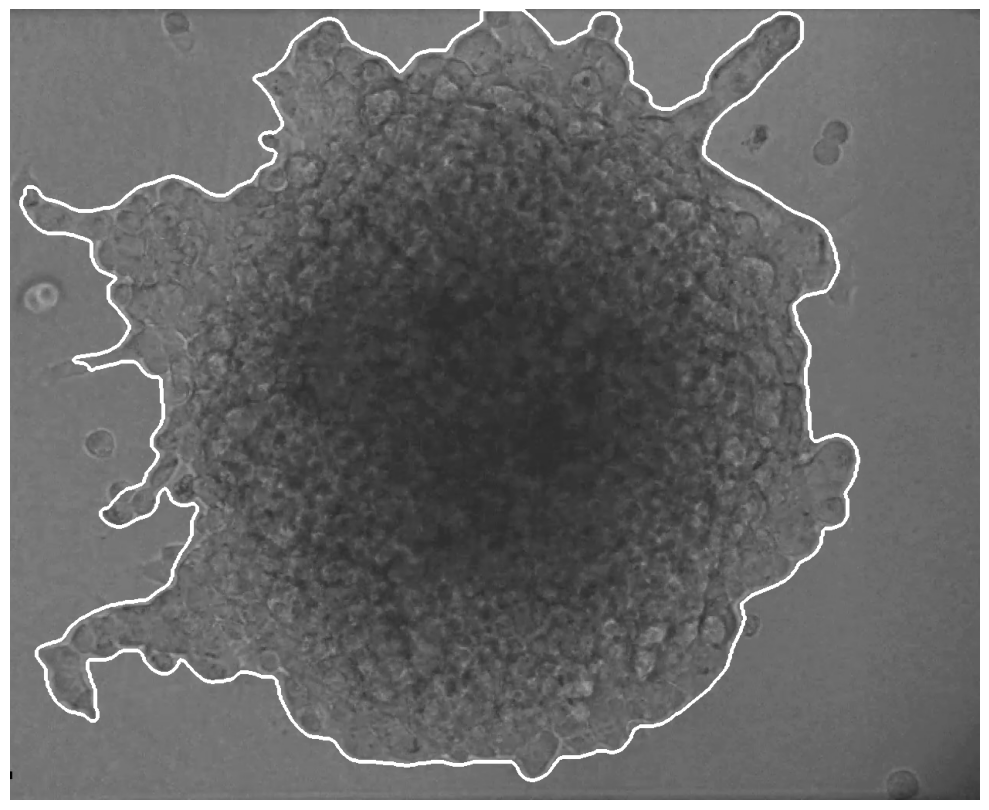

True

In [24]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# File paths
boundary_image_path = "/Users/sheriffakeeb/GSU Dropbox Dropbox/Sheriff Akeeb/Projects/Articles/main paper/supplementary/snapshot_8s_boundary.png"
original_image_path = "/Users/sheriffakeeb/GSU Dropbox Dropbox/Sheriff Akeeb/Projects/Articles/main paper/supplementary/snapshot_8s.png"

# Load the grayscale boundary image
boundary_image = cv2.imread(boundary_image_path, cv2.IMREAD_GRAYSCALE)

# Threshold to get binary mask
_, thresh = cv2.threshold(boundary_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Find contours
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Load the original image
original_image = cv2.imread(original_image_path)

# Draw white, thick contours (thickness = 3)
overlay_image = original_image.copy()
cv2.drawContours(overlay_image, contours, -1, (255, 255, 255), thickness=3)

# Display result
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(overlay_image, cv2.COLOR_BGR2RGB))
# plt.title("White Boundary Overlay on Original Image")
plt.axis("off")
plt.tight_layout()
plt.show()

output_path = "../../Results/Sample/experiment_tumor.png"
cv2.imwrite(output_path, overlay_image)



'../../Results/Plots/domain_and_geometry.png'

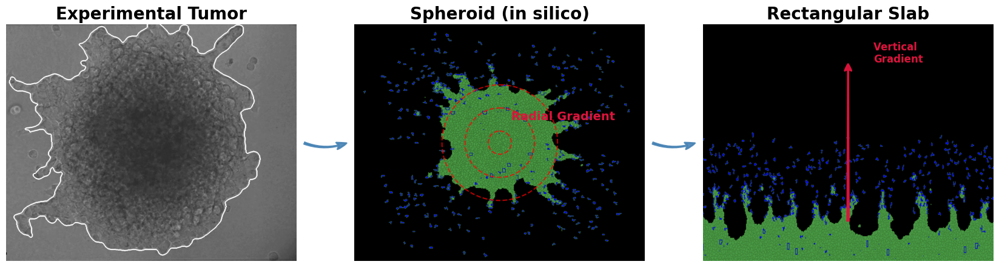

In [33]:
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib.patches as patches
import numpy as np
from pathlib import Path

plt.style.use('default')

base_path = Path("../../Results/Sample")

# Load original images
img_experiment = Image.open(base_path / "experiment_tumor.png")
img_spheroid = Image.open(base_path / "spheroid.png")
img_rectangular = Image.open(base_path / "rectangular_slab.png")

# Resize all images to match the experimental image size
target_size = img_experiment.size
img_experiment = img_experiment.resize(target_size)
img_spheroid = img_spheroid.resize(target_size)
img_rectangular = img_rectangular.resize(target_size)

# Start plotting
fig, axs = plt.subplots(1, 3, figsize=(21, 7))
for ax in axs:
    ax.axis('off')

axs[0].imshow(img_experiment)
axs[1].imshow(img_spheroid)
axs[2].imshow(img_rectangular)

# Concentric circles and annotation on spheroid image
img_np = np.array(img_spheroid)
center_x, center_y = img_np.shape[1] // 2, img_np.shape[0] // 2
radii = [50, 150, 250]

for r in radii:
    circle = patches.Circle((center_x, center_y), r, fill=False,
                            linestyle='--', edgecolor='red', linewidth=1.5, alpha=0.7)
    axs[1].add_patch(circle)

axs[1].annotate("Radial Gradient",
                xy=(center_x + 50, center_y - 20),
                xytext=(center_x + 50, center_y - 100),
                fontsize=14, color='crimson', weight='bold', ha='left')

# Titles
axs[0].set_title("Experimental Tumor", fontsize=20, weight='bold')
axs[1].set_title("Spheroid (in silico)", fontsize=20, weight='bold')
axs[2].set_title("Rectangular Slab", fontsize=20, weight='bold')

# Arrows between panels
for i in range(2):
    bbox1 = axs[i].get_position()
    bbox2 = axs[i + 1].get_position()
    x0 = bbox1.x1 + 0.005
    y0 = (bbox1.y0 + bbox1.y1) / 2
    x1 = bbox2.x0 - 0.005
    y1 = (bbox2.y0 + bbox2.y1) / 2

    fig.patches.append(
        patches.FancyArrowPatch(
            (x0, y0), (x1, y1),
            transform=fig.transFigure,
            connectionstyle="arc3,rad=0.2",
            arrowstyle='Fancy,head_length=12,head_width=8,tail_width=2',
            color='steelblue',
            linewidth=2,
            alpha=0.9
        )
    )

# Vertical arrow for gradient
right_pos = axs[2].get_position()
x_right = (right_pos.x0 + right_pos.x1) / 2
y_bottom = right_pos.y1 - 0.09

fig.patches.append(
    patches.FancyArrowPatch(
        (x_right, right_pos.y0 + 0.09), (x_right, y_bottom),
        transform=fig.transFigure,
        arrowstyle='Fancy,head_length=8,head_width=8,tail_width=2',
        color='crimson', linewidth=2.0, alpha=0.95
    )
)

fig.text(
    x_right + 0.02, y_bottom,
    "Vertical \nGradient",
    fontsize=12, color='crimson', ha='left', weight='bold'
)

# Save
designed_figure_path = "../../Results/Plots/domain_and_geometry.png"
plt.savefig(designed_figure_path, dpi=300, bbox_inches='tight')
designed_figure_path


# Phenotype Classification to show the various Invasion Metrics

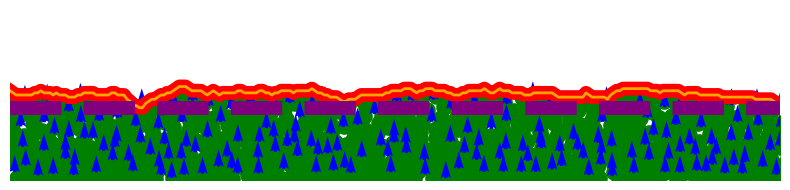

Saved: No_Invasion.png


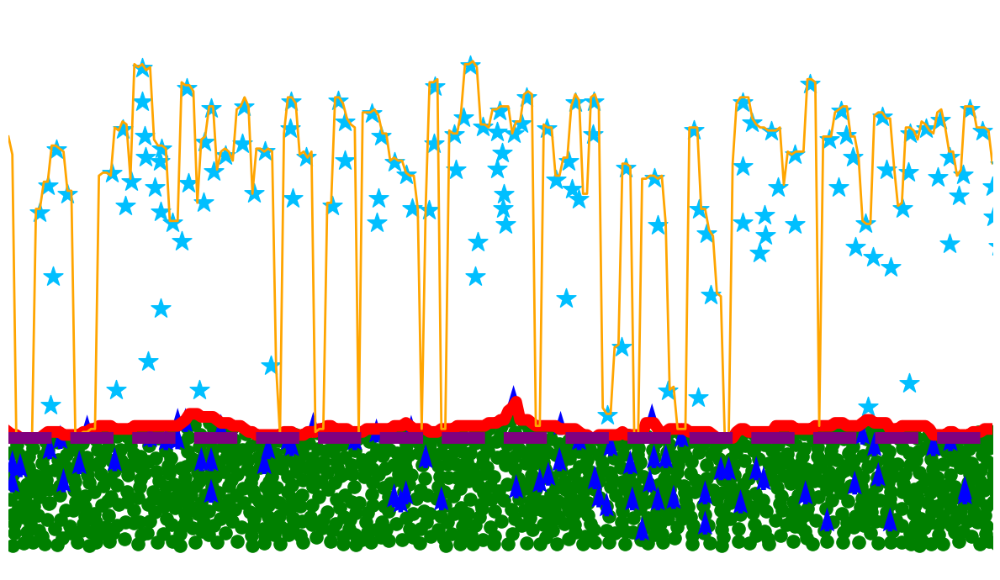

Saved: Single_Cell_Invasion.png


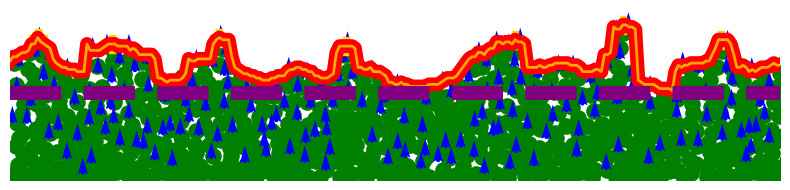

Saved: Bulk_Invasion.png


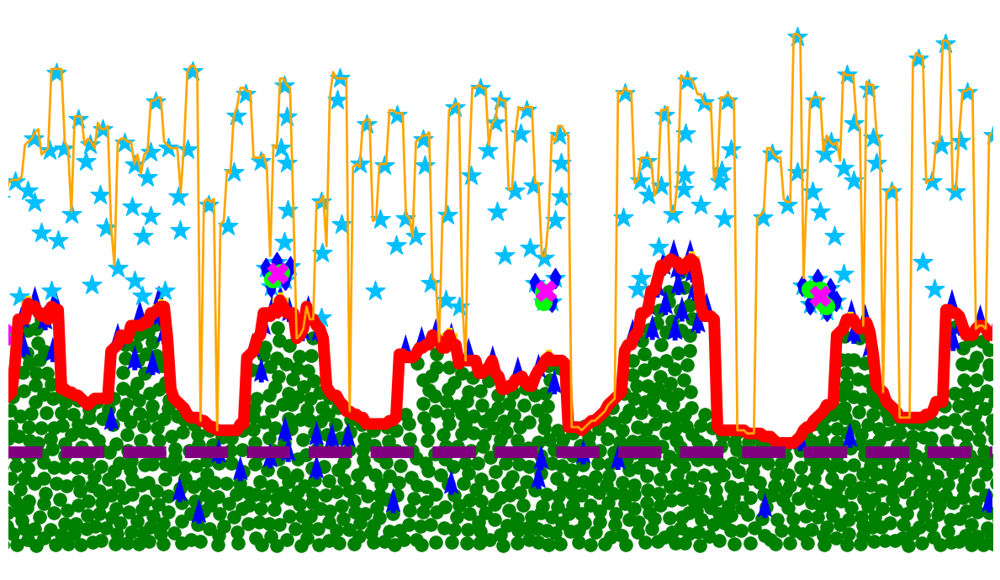

Saved: Multimodal_Invasion.png


In [86]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
import glob
from matplotlib.lines import Line2D
from scipy.signal import find_peaks
from matplotlib.path import Path
from matplotlib.markers import MarkerStyle
import ast

# Teardrop marker
verts = [
    (0.0, 1.0), (-0.5, 0.2), (-0.3, -0.6), (0.0, -1.0),
    (0.3, -0.6), (0.5, 0.2), (0.0, 1.0)
]
codes = [Path.MOVETO] + [Path.LINETO] * (len(verts) - 2) + [Path.CLOSEPOLY]
teardrop_marker = MarkerStyle(Path(verts, codes))


phenotypes = {
    "No_Invasion": "No_Invasion.png",
    "Single_cell_invasion": "Single_Cell_Invasion.png",
    "Bulk_Invasion": "Bulk_Invasion.png",
    "Multimodal_invasion": "Multimodal_Invasion.png"
}

results_base = "../../Results/Sample"
save_base = "../../Results/Plots/Phenotype_Composite"


# Function to process and plot
def process_phenotype(phenotype_folder, output_filename):
    base_folder = os.path.join(results_base, phenotype_folder)

    boundary_files = glob.glob(os.path.join(base_folder, 'PositionData_*', 'BoundaryData_*.csv'))
    defector_files = glob.glob(os.path.join(base_folder, 'PositionData_*', 'DefectorPosition_*.csv'))
    tumor_files = glob.glob(os.path.join(base_folder, 'PositionData_*', 'TumorPosition_*.csv'))
    leader_files = glob.glob(os.path.join(base_folder, 'PositionData_*', 'TumorLeaderCells_*.csv'))
    follower_files = glob.glob(os.path.join(base_folder, 'PositionData_*', 'TumorFollowerCells_*.csv'))
    cluster_files = glob.glob(os.path.join(base_folder, 'PositionData_*', 'ClusterComposition_*.csv'))

    if not all([boundary_files, defector_files, tumor_files, leader_files, follower_files, cluster_files]):
        print(f"Skipping {phenotype_folder}: Required files not found.")
        return

    # Load data
    boundary_df = pd.read_csv(boundary_files[0])
    defector_df = pd.read_csv(defector_files[0])
    tumor_df = pd.read_csv(tumor_files[0])
    leader_df = pd.read_csv(leader_files[0])
    follower_df = pd.read_csv(follower_files[0])
    cluster_df = pd.read_csv(cluster_files[0])
    cluster_df.columns = cluster_df.columns.str.strip()

    # Parse leader/follower coordinates if available
    has_member_columns = all(col in cluster_df.columns for col in [
        'Member_Leader_X', 'Member_Leader_Y',
        'Member_Follower_X', 'Member_Follower_Y'
    ])
    if has_member_columns:
        def parse_column(df, col_name):
            return df[col_name].apply(ast.literal_eval)

        cluster_leader_xs = [x for sublist in parse_column(cluster_df, 'Member_Leader_X') for x in sublist]
        cluster_leader_ys = [y for sublist in parse_column(cluster_df, 'Member_Leader_Y') for y in sublist]
        cluster_follower_xs = [x for sublist in parse_column(cluster_df, 'Member_Follower_X') for x in sublist]
        cluster_follower_ys = [y for sublist in parse_column(cluster_df, 'Member_Follower_Y') for y in sublist]

    # Boundary data
    x = boundary_df['X']
    main_tumor = boundary_df['Main_Tumor']
    outermost = boundary_df['Outermost']
    lowest_point = boundary_df['Lowesr_boundary_point']
    main_tumor_array = main_tumor.to_numpy()

    # Detect fingers
    raw_peaks, _ = find_peaks(main_tumor_array, prominence=10, distance=10, width=5)
    merged_peaks = []
    min_sep = 15
    last = -np.inf
    for p in raw_peaks:
        if p - last > min_sep:
            merged_peaks.append(p)
            last = p
    finger_peaks = np.array(merged_peaks)

    # Start plot
    plt.figure(figsize=(12 if "Single_Cell_Invasion" in output_filename or "Multimodal" in output_filename else 8, 7 if "Single_Cell_Invasion" in output_filename or "Multimodal" in output_filename else 2))
    plt.plot(x, main_tumor, label='Core Tumor Boundary', linewidth=10, color='red')
    plt.plot(x, outermost, label='Outermost Boundary', linewidth=2, color='orange')
    plt.scatter(x, outermost, color='white', s=10)
    plt.plot(x, lowest_point, label='Lowest Point', linestyle='--', linewidth=10, color='purple')

    # Tumor/follower/leader
    plt.scatter(follower_df['x'], follower_df['y'], color='green', marker='o', s=120)
    plt.quiver(
        leader_df['x'], leader_df['y'],
        np.zeros_like(leader_df['x']),
        np.full_like(leader_df['y'], 4),
        color='blue', angles='xy', scale_units='xy', scale=0.5, width=0.005
    )

    # Defectors and clusters
    plt.scatter(defector_df['x'], defector_df['y'], color='deepskyblue', marker='*', s=300)
    plt.scatter(cluster_df['Centroid_X'], cluster_df['Centroid_Y'], color='magenta', marker='X', s=300)

    if "Bulk" in output_filename or "Multimodal" in output_filename:
        plt.scatter(x[finger_peaks], main_tumor_array[finger_peaks], marker='P', color='gold', s=150)

    if "Multimodal" in output_filename and has_member_columns:
        for lx, ly in zip(cluster_leader_xs, cluster_leader_ys):
            plt.scatter(lx, ly, marker=teardrop_marker, s=300, color='blue', label='Leader in Cluster' if 'Leader in Cluster' not in plt.gca().get_legend_handles_labels()[1] else "")
        for fx, fy in zip(cluster_follower_xs, cluster_follower_ys):
            plt.scatter(fx, fy, color='lime', s=200, label='Follower in Cluster' if 'Follower in Cluster' not in plt.gca().get_legend_handles_labels()[1] else "")
        plt.scatter(cluster_df['Centroid_X'], cluster_df['Centroid_Y'], color='magenta', marker='X', s=300, label='Cluster Centroid')

    plt.xticks([])
    plt.yticks([])
    plt.xlabel("")
    plt.ylabel("")
    for spine in plt.gca().spines.values():
        spine.set_visible(False)
    plt.tick_params(colors='white')

    # Axis limits
    if "Bulk" in output_filename or "No_Invasion" in output_filename:
        plt.xlim(0, 250)
        plt.ylim(0, 80)
    elif "Single_Cell_Invasion" in output_filename:
        plt.xlim(0, 250)
    else:
        plt.xlim(83, 380)

    plt.tight_layout()
    plt.savefig(os.path.join(save_base, output_filename), dpi=300, bbox_inches='tight')
    plt.show()
    print(f"Saved: {output_filename}")

# Run for each phenotype
for folder, filename in phenotypes.items():
    process_phenotype(folder, filename)


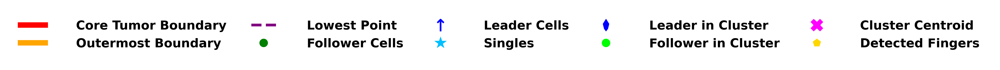

Saved standalone legend: ../../Results/Plots/Phenotype_Composite/Legend.png


In [87]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.path import Path
from matplotlib.markers import MarkerStyle
import os

# Define teardrop marker
verts = [
    (0.0, 1.0), (-0.5, 0.2), (-0.3, -0.6), (0.0, -1.0),
    (0.3, -0.6), (0.5, 0.2), (0.0, 1.0)
]
codes = [Path.MOVETO] + [Path.LINETO] * (len(verts) - 2) + [Path.CLOSEPOLY]
teardrop_marker = MarkerStyle(Path(verts, codes))

plt.style.use('default')  

save_path = "/Users/sheriffakeeb/Desktop/TumorInvasion/Results/Plots/Phenotype_Composite/Legend.png"
save_path = "../../Results/Plots/Phenotype_Composite/Legend.png"


# Create dummy figure
fig = plt.figure(figsize=(12, 2))

# Legend handles with increased marker sizes
legend_handles = [
    Line2D([0], [0], color='red', lw=20, label='Core Tumor Boundary'),
    Line2D([0], [0], color='orange', lw=20, label='Outermost Boundary'),
    Line2D([0], [0], color='purple', lw=10, linestyle='--', label='Lowest Point'),
    Line2D([0], [0], color='green', marker='o', linestyle='None', markersize=30, label='Follower Cells'),
    Line2D([0], [0], color='blue', marker=r'$\uparrow$', linestyle='None', markersize=45, label='Leader Cells'),
    Line2D([0], [0], color='deepskyblue', marker='*', linestyle='None', markersize=45, label='Singles'),
    Line2D([0], [0], color='blue', marker=teardrop_marker, linestyle='None', markersize=45, label='Leader in Cluster'),
    Line2D([0], [0], color='lime', marker='o', linestyle='None', markersize=30, label='Follower in Cluster'),
    Line2D([0], [0], color='magenta', marker='X', linestyle='None', markersize=45, label='Cluster Centroid'),
    Line2D([0], [0], color='gold', marker='p', linestyle='None', markersize=30, label='Detected Fingers')
]

# Draw the legend
legend = fig.legend(
    handles=legend_handles,
    loc='center',
    ncol=5,
    frameon=False,
    fontsize=45,
    handlelength=2.0,
    borderpad=1.5,
    handletextpad=2.5
)

for text in legend.get_texts():
    text.set_fontsize(45)
    text.set_fontweight('bold')

plt.axis('off')
plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
plt.show()

print(f"Saved standalone legend: {save_path}")
